<a href="https://colab.research.google.com/github/suzuken0/practice/blob/main/Mobius2label.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#@title #ライブラリのインストール
#@markdown [shift]+[Enter]を押して起動してください
from google.colab import drive
drive.mount('/content/drive')
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import measure
import json
from tqdm import tqdm  # tqdmをインポート
import os
import matplotlib

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#@title #ディレクトリと座標の個数
#@markdown 指定を終えてから、[shift]+[Enter]を押して起動してください。
#@markdown <br> 学習に適切な個数が分からなかったので、変更できるようにしました。

# 入力ディレクトリと出力ディレクトリを指定してください
input_dir = "/content/drive/MyDrive/Colab Notebooks/anterior_segmentation_project/dataset/MOBIUS/Masks/1"
output_dir = "/content"

# eyelid, iris, pupilごとに座標の個数を指定してください。
num_points_eyelid = 24
num_points_iris = 16
num_points_pupil = 12

Processing images:   0%|          | 0/144 [00:00<?, ?it/s]

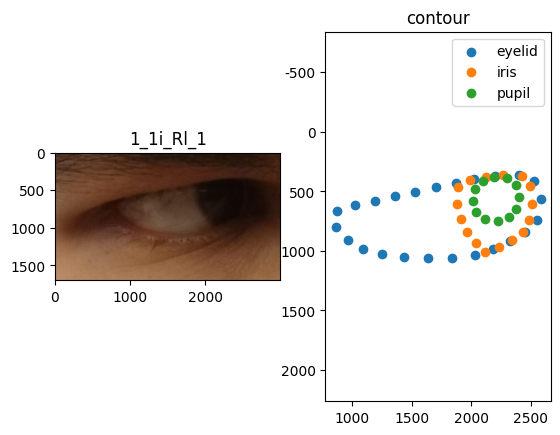

Processing images:   1%|          | 1/144 [00:04<10:30,  4.41s/it]

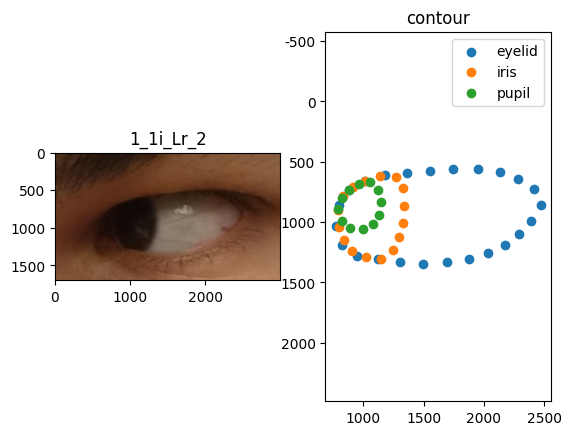

Processing images:   1%|▏         | 2/144 [00:08<10:37,  4.49s/it]

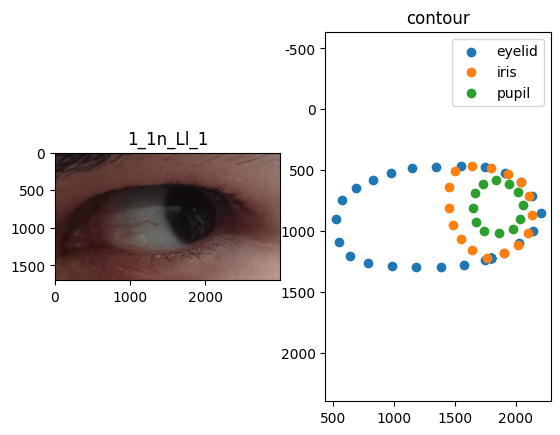

Processing images:   2%|▏         | 3/144 [00:11<08:46,  3.73s/it]

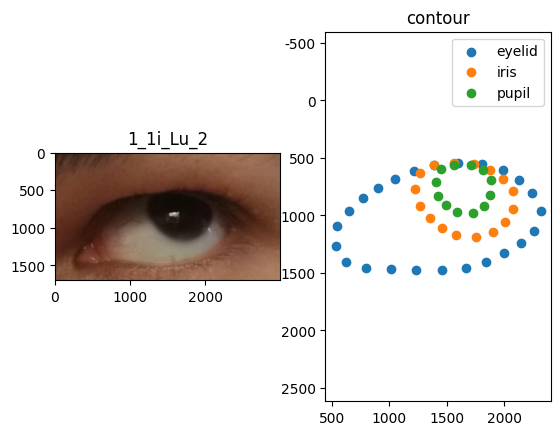

Processing images:   3%|▎         | 4/144 [00:14<08:04,  3.46s/it]

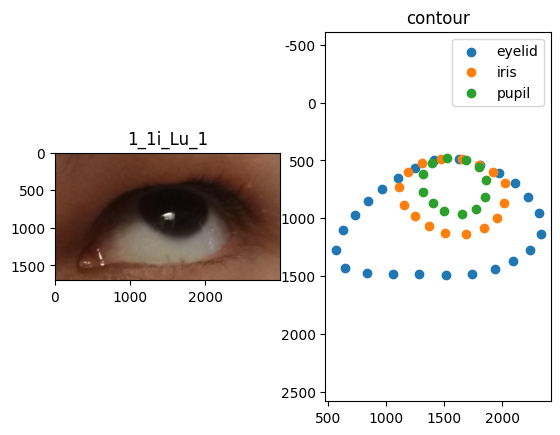

Processing images:   3%|▎         | 5/144 [00:18<07:48,  3.37s/it]

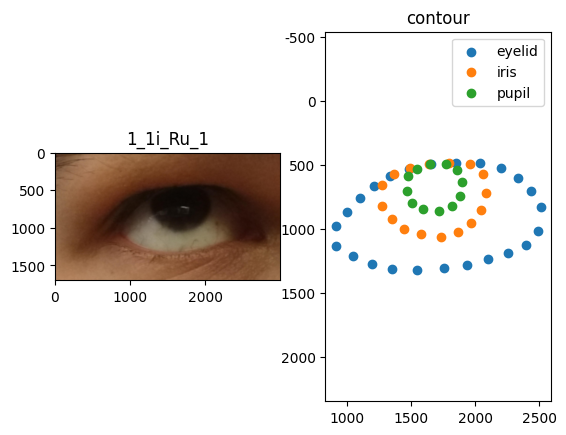

Processing images:   4%|▍         | 6/144 [00:20<06:55,  3.01s/it]

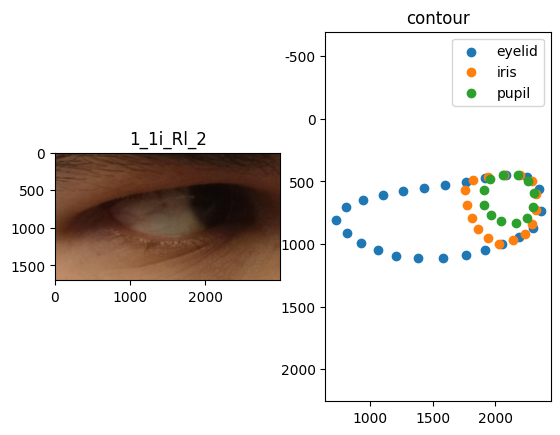

Processing images:   5%|▍         | 7/144 [00:22<06:22,  2.79s/it]

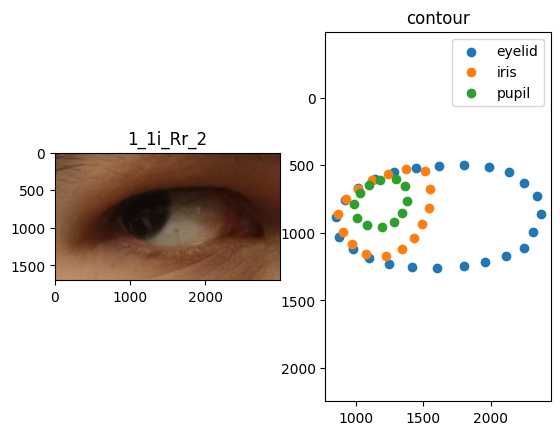

Processing images:   6%|▌         | 8/144 [00:24<05:54,  2.61s/it]

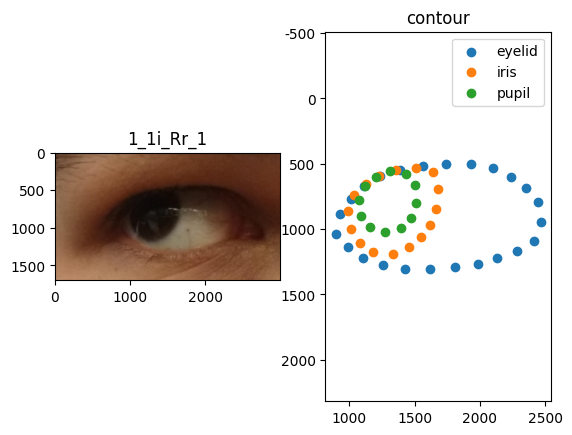

Processing images:   6%|▋         | 9/144 [00:27<05:40,  2.52s/it]

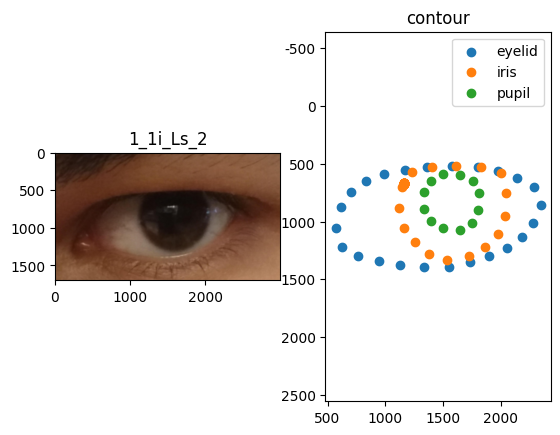

Processing images:   7%|▋         | 10/144 [00:30<06:08,  2.75s/it]

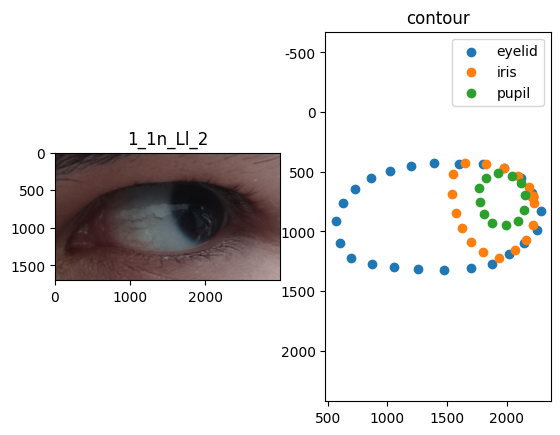

Processing images:   8%|▊         | 11/144 [00:33<06:08,  2.77s/it]

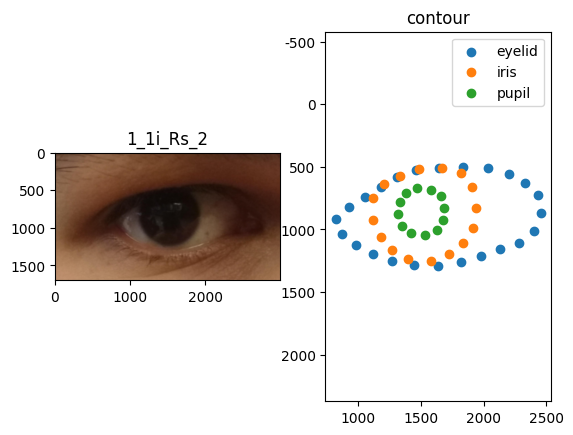

Processing images:   8%|▊         | 12/144 [00:35<05:48,  2.64s/it]

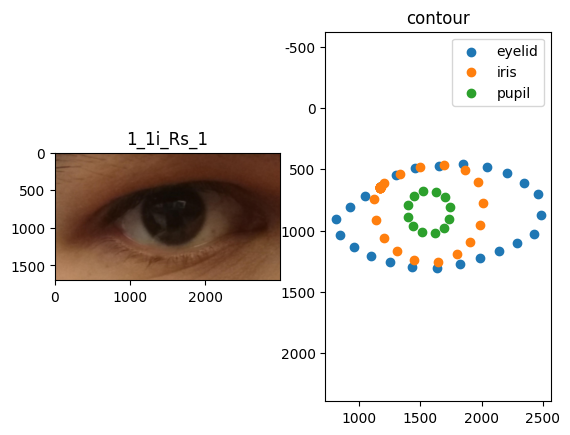

Processing images:   9%|▉         | 13/144 [00:37<05:33,  2.54s/it]

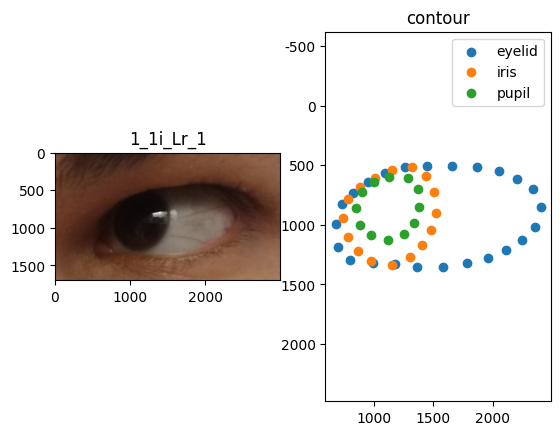

Processing images:  10%|▉         | 14/144 [00:40<05:18,  2.45s/it]

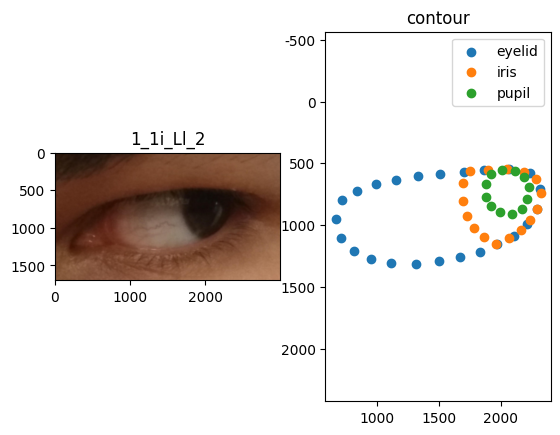

Processing images:  10%|█         | 15/144 [00:42<05:17,  2.46s/it]

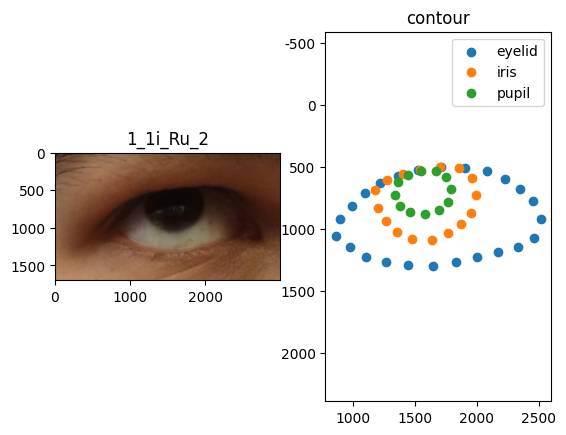

Processing images:  11%|█         | 16/144 [00:46<06:01,  2.83s/it]

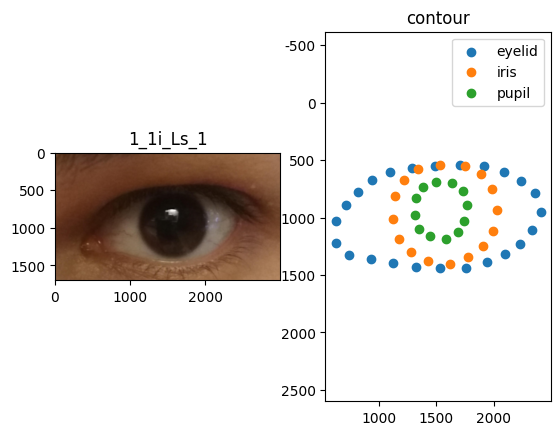

Processing images:  12%|█▏        | 17/144 [00:48<05:43,  2.71s/it]

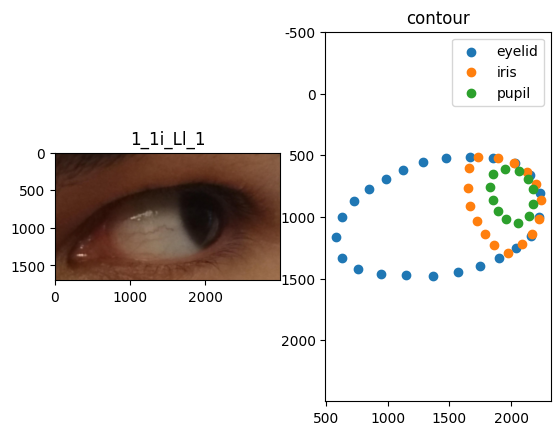

Processing images:  12%|█▎        | 18/144 [00:50<05:21,  2.55s/it]

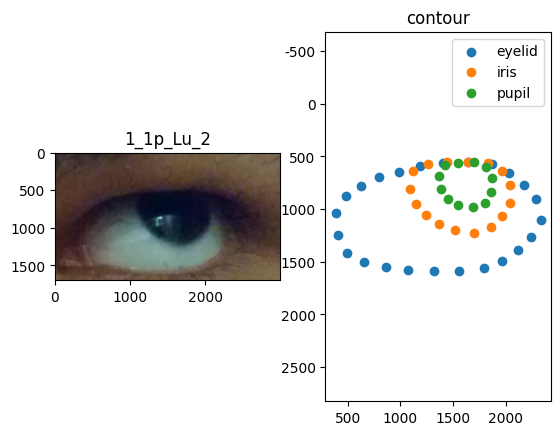

Processing images:  13%|█▎        | 19/144 [00:53<05:14,  2.51s/it]

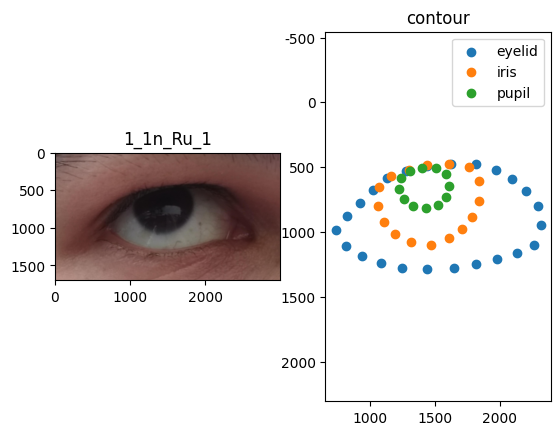

Processing images:  14%|█▍        | 20/144 [00:55<05:05,  2.46s/it]

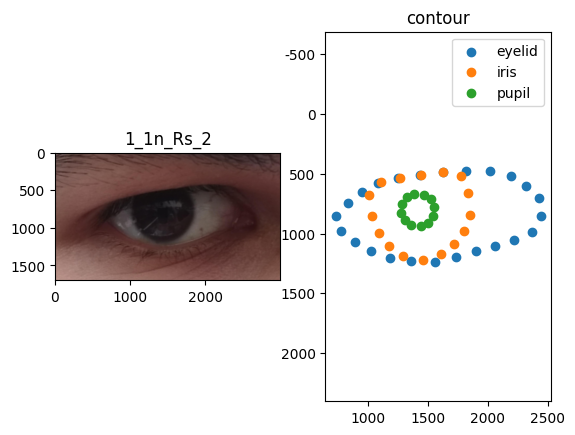

Processing images:  15%|█▍        | 21/144 [00:58<05:21,  2.61s/it]

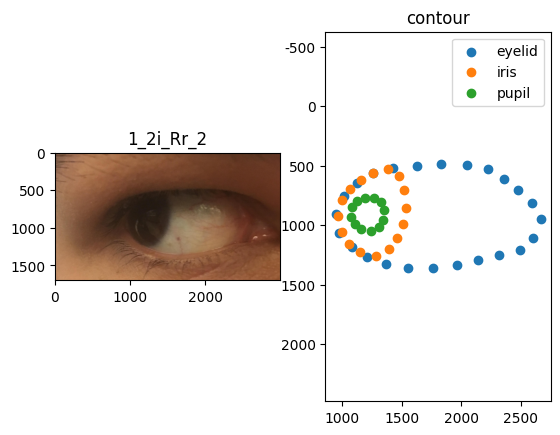

Processing images:  15%|█▌        | 22/144 [01:01<05:39,  2.78s/it]

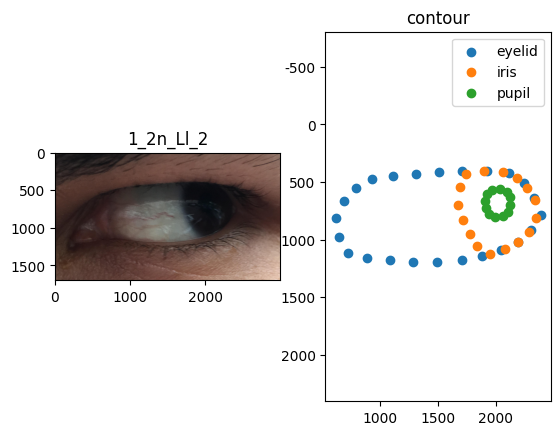

Processing images:  16%|█▌        | 23/144 [01:04<05:15,  2.61s/it]

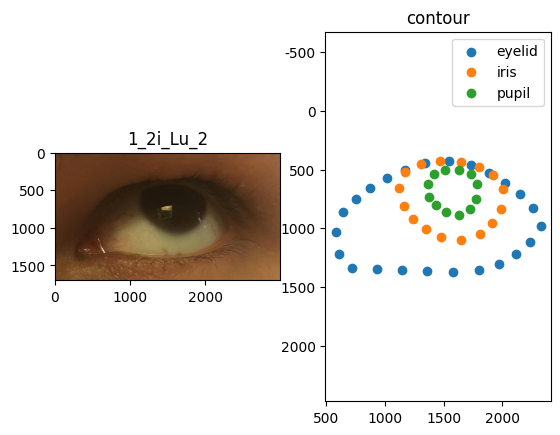

Processing images:  17%|█▋        | 24/144 [01:06<05:04,  2.54s/it]

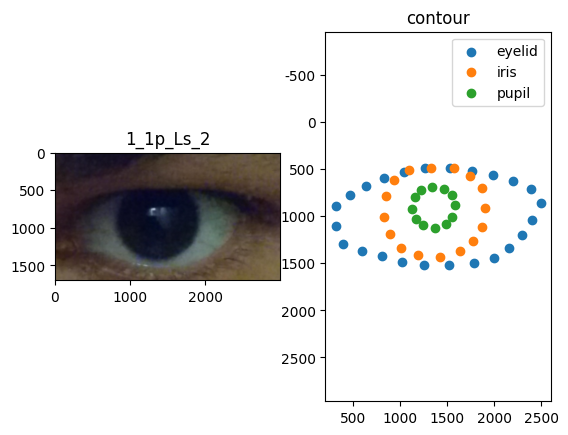

Processing images:  17%|█▋        | 25/144 [01:08<04:56,  2.49s/it]

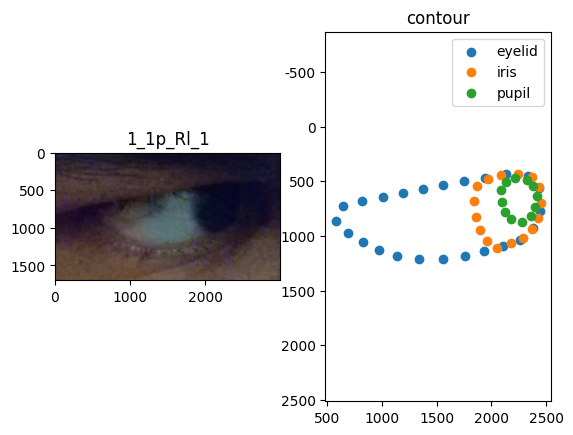

Processing images:  18%|█▊        | 26/144 [01:11<05:03,  2.57s/it]

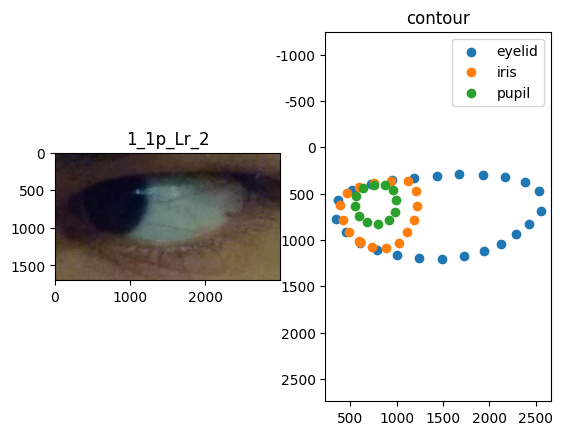

Processing images:  19%|█▉        | 27/144 [01:15<05:52,  3.01s/it]

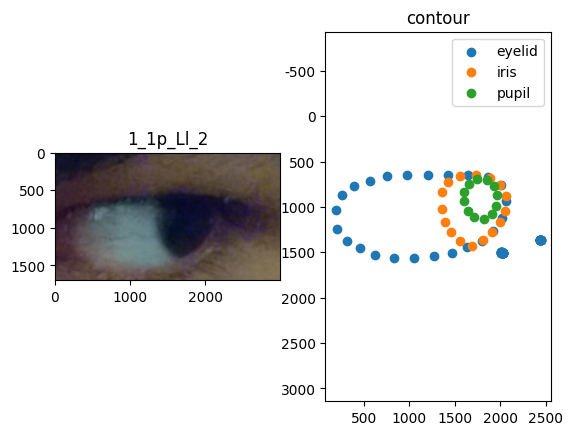

Processing images:  19%|█▉        | 28/144 [01:17<05:22,  2.78s/it]

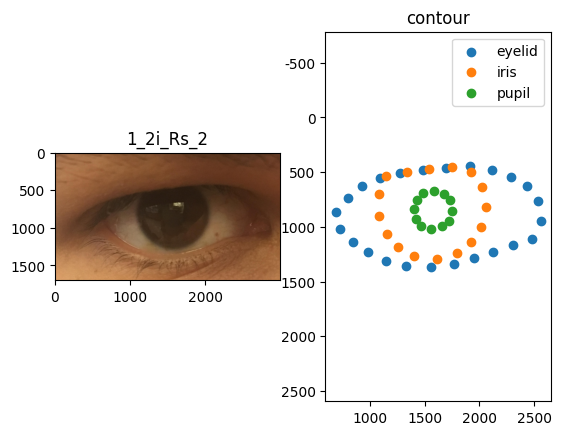

Processing images:  20%|██        | 29/144 [01:20<05:10,  2.70s/it]

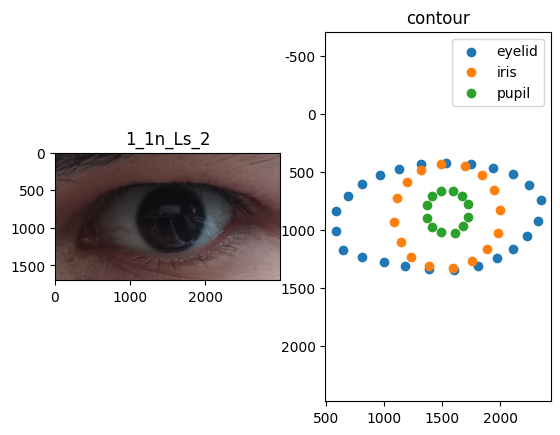

Processing images:  21%|██        | 30/144 [01:22<04:56,  2.60s/it]

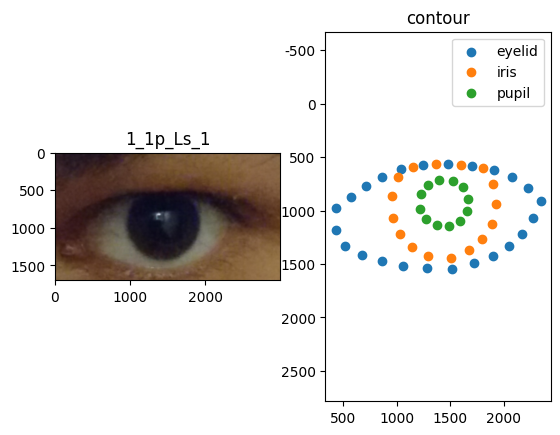

Processing images:  22%|██▏       | 31/144 [01:25<04:53,  2.60s/it]

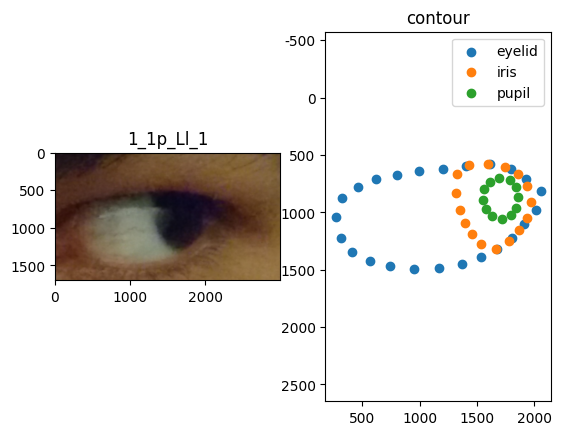

Processing images:  22%|██▏       | 32/144 [01:28<05:21,  2.87s/it]

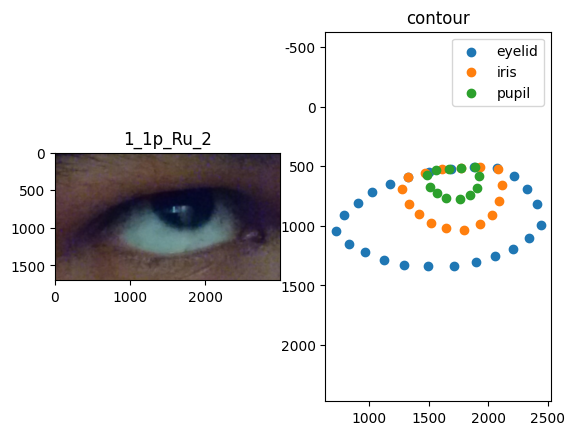

Processing images:  23%|██▎       | 33/144 [01:32<05:30,  2.97s/it]

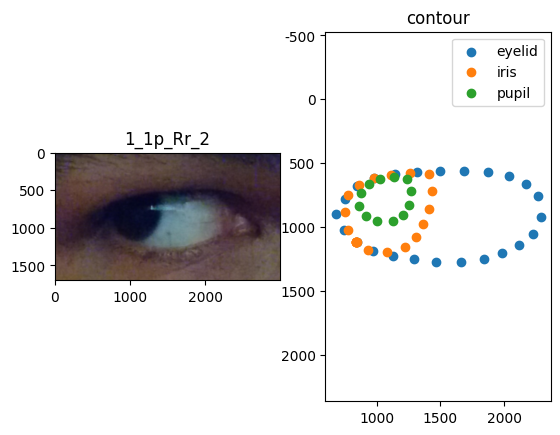

Processing images:  24%|██▎       | 34/144 [01:34<05:03,  2.76s/it]

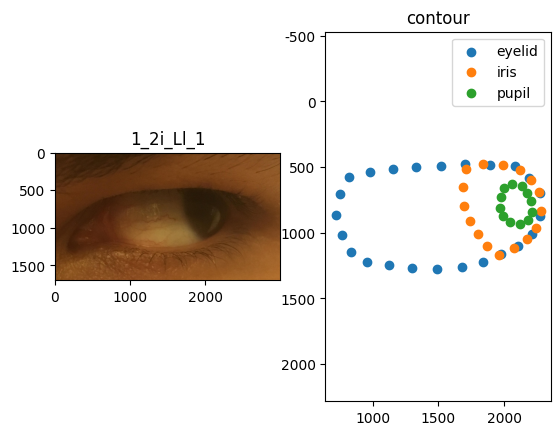

Processing images:  24%|██▍       | 35/144 [01:36<04:50,  2.67s/it]

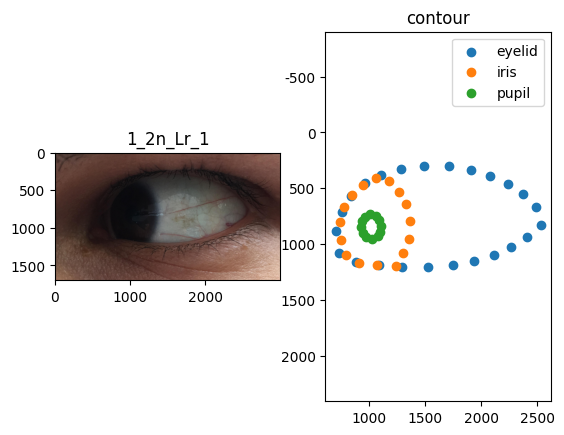

Processing images:  25%|██▌       | 36/144 [01:39<04:38,  2.58s/it]

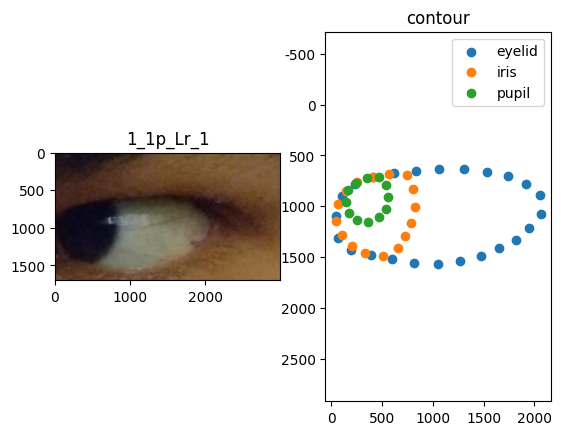

Processing images:  26%|██▌       | 37/144 [01:42<05:03,  2.84s/it]

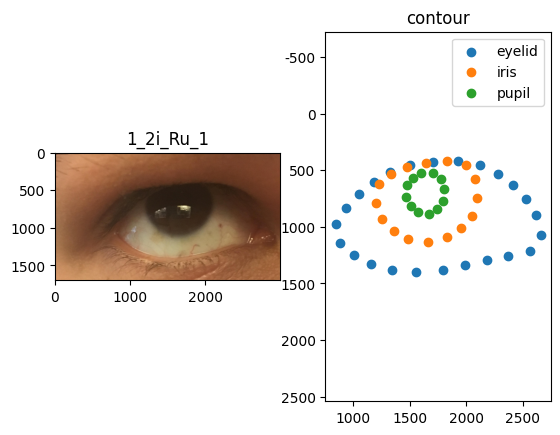

Processing images:  26%|██▋       | 38/144 [01:45<04:58,  2.81s/it]

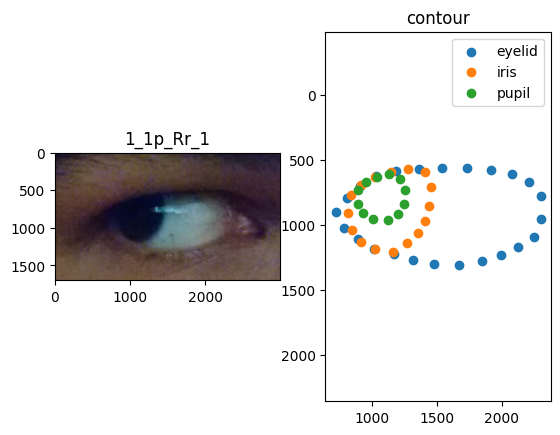

Processing images:  27%|██▋       | 39/144 [01:47<04:36,  2.63s/it]

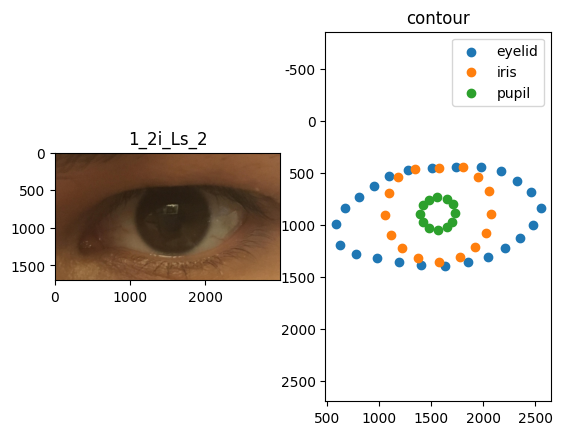

Processing images:  28%|██▊       | 40/144 [01:50<04:36,  2.65s/it]

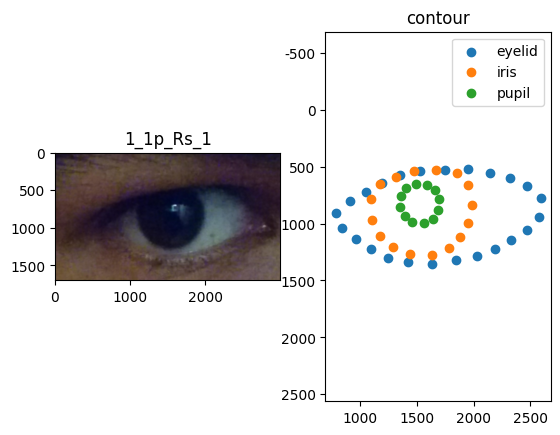

Processing images:  28%|██▊       | 41/144 [01:52<04:22,  2.55s/it]

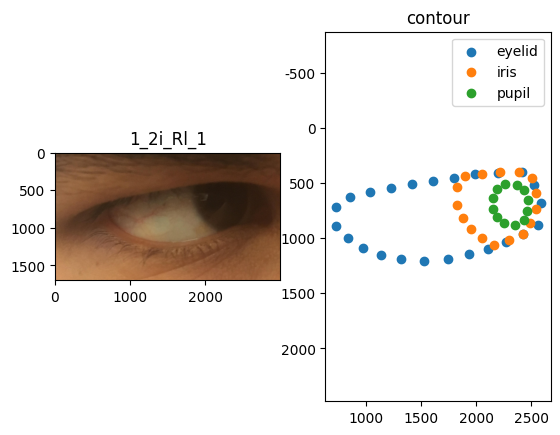

Processing images:  29%|██▉       | 42/144 [01:55<04:28,  2.64s/it]

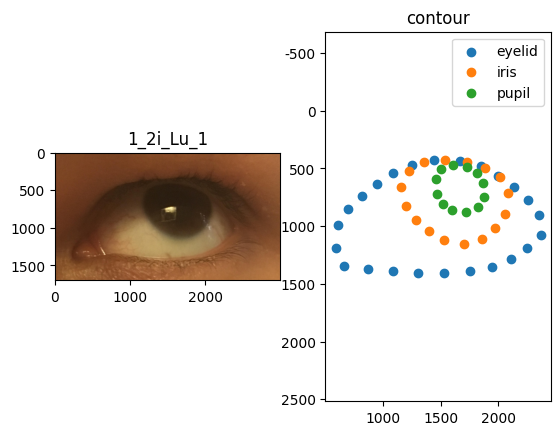

Processing images:  30%|██▉       | 43/144 [01:58<04:47,  2.85s/it]

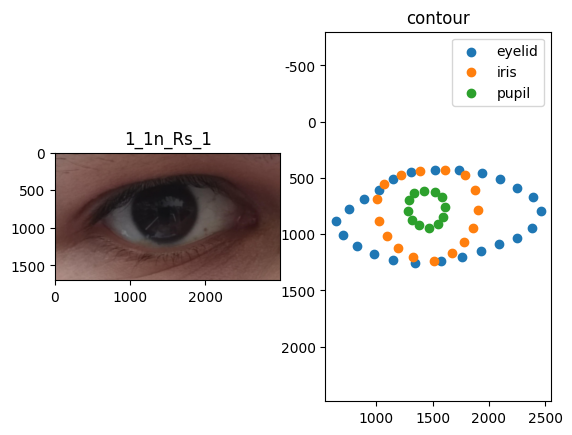

Processing images:  31%|███       | 44/144 [02:01<04:28,  2.68s/it]

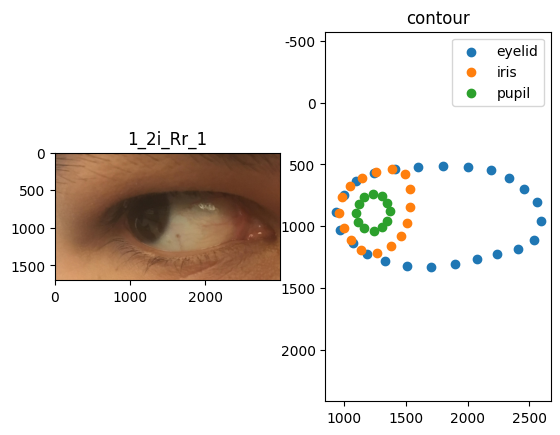

Processing images:  31%|███▏      | 45/144 [02:03<04:14,  2.57s/it]

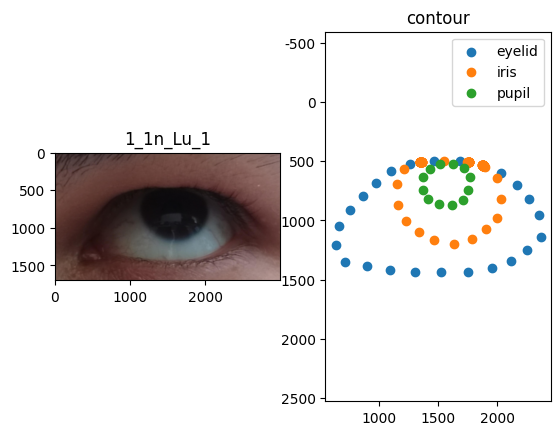

Processing images:  32%|███▏      | 46/144 [02:05<04:04,  2.50s/it]

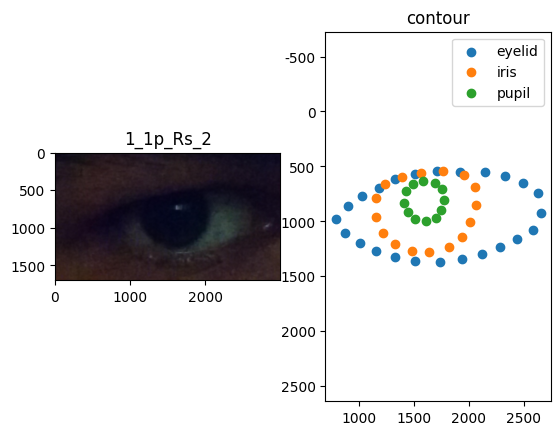

Processing images:  33%|███▎      | 47/144 [02:09<04:44,  2.93s/it]

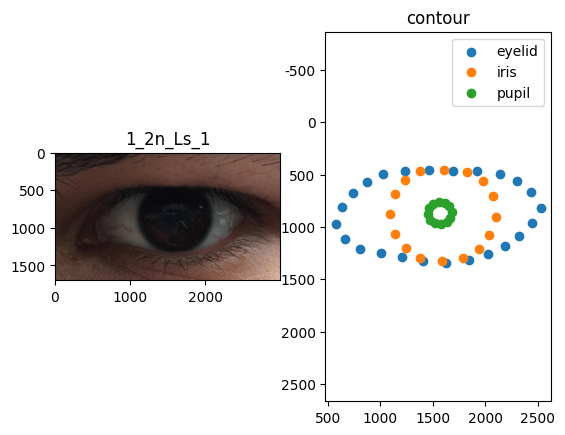

Processing images:  33%|███▎      | 48/144 [02:15<06:00,  3.76s/it]

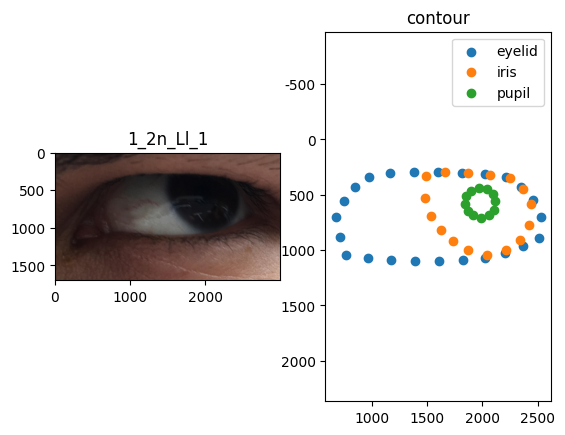

Processing images:  34%|███▍      | 49/144 [02:17<05:19,  3.36s/it]

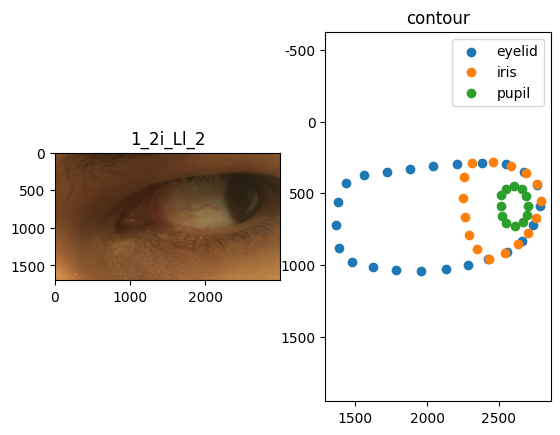

Processing images:  35%|███▍      | 50/144 [02:21<05:19,  3.40s/it]

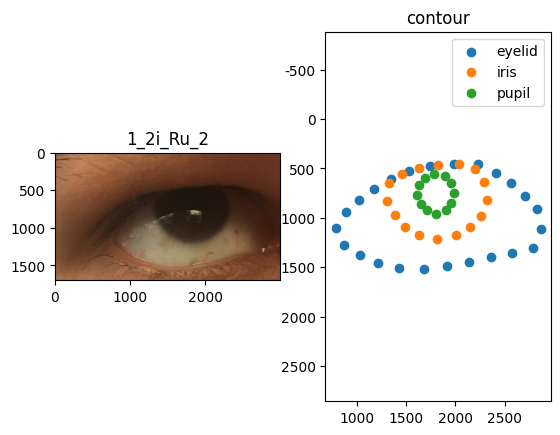

Processing images:  35%|███▌      | 51/144 [02:25<05:29,  3.55s/it]

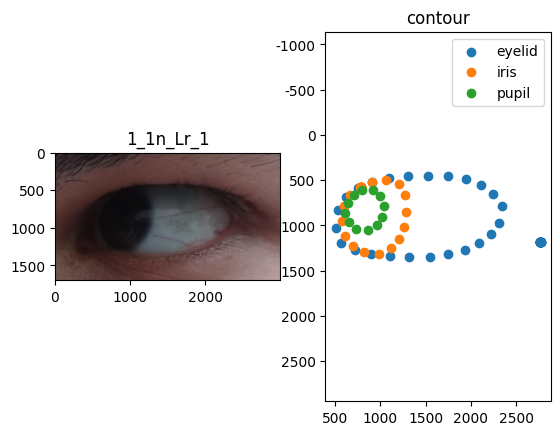

Processing images:  36%|███▌      | 52/144 [02:29<05:56,  3.87s/it]

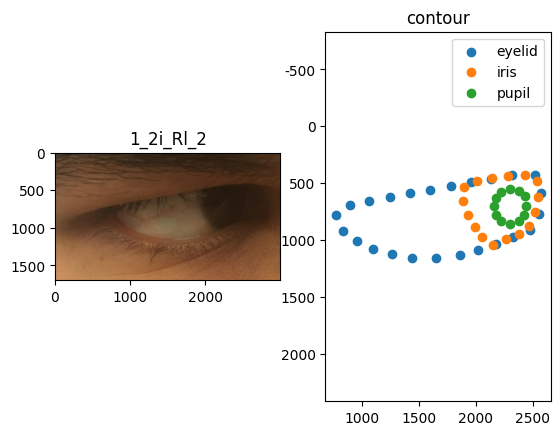

Processing images:  37%|███▋      | 53/144 [02:32<05:20,  3.53s/it]

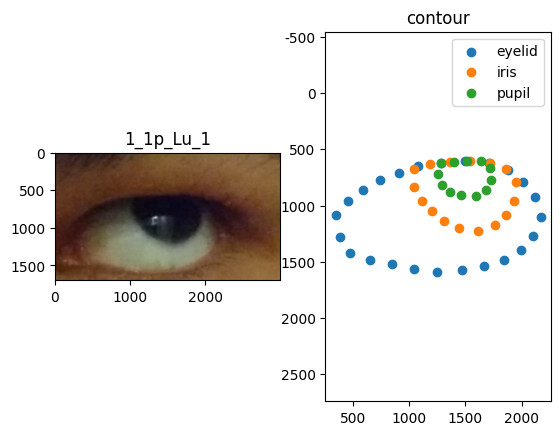

Processing images:  38%|███▊      | 54/144 [02:35<05:10,  3.45s/it]

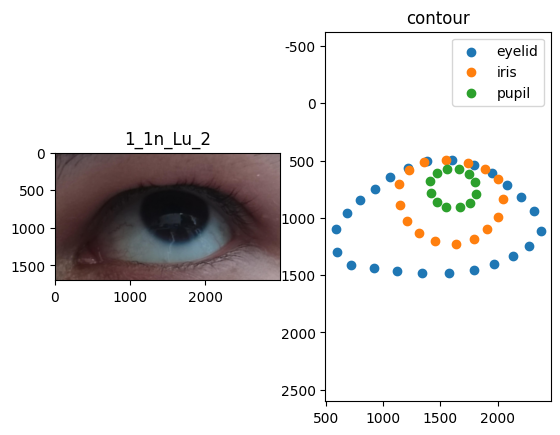

Processing images:  38%|███▊      | 55/144 [02:39<05:20,  3.60s/it]

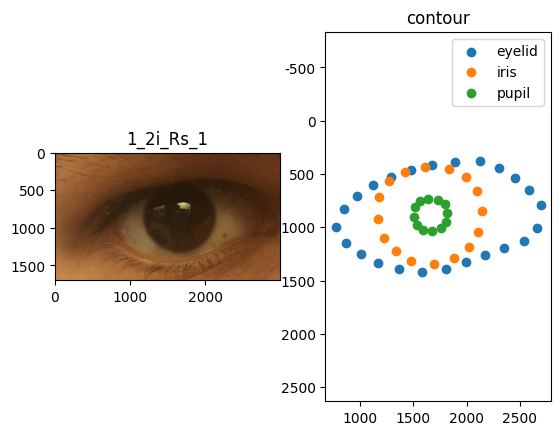

Processing images:  39%|███▉      | 56/144 [02:44<05:48,  3.97s/it]

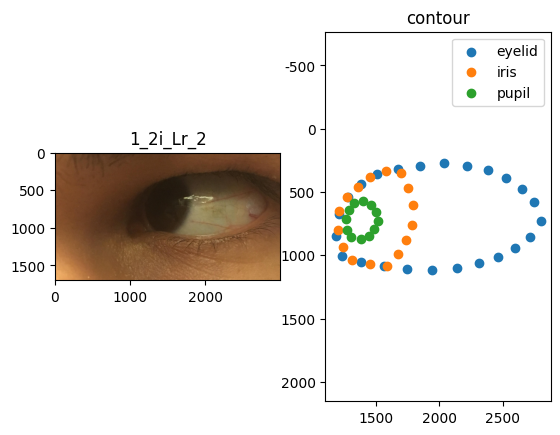

Processing images:  40%|███▉      | 57/144 [02:47<05:19,  3.67s/it]

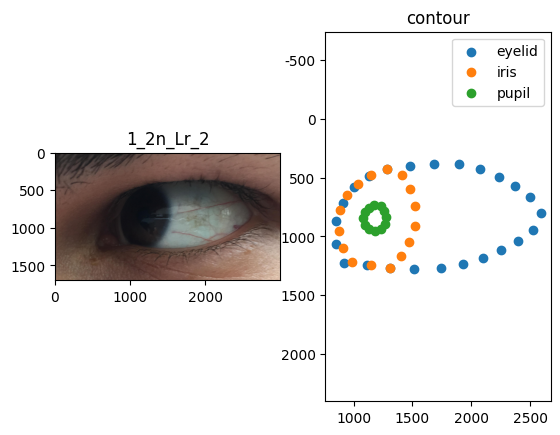

Processing images:  40%|████      | 58/144 [02:50<05:01,  3.50s/it]

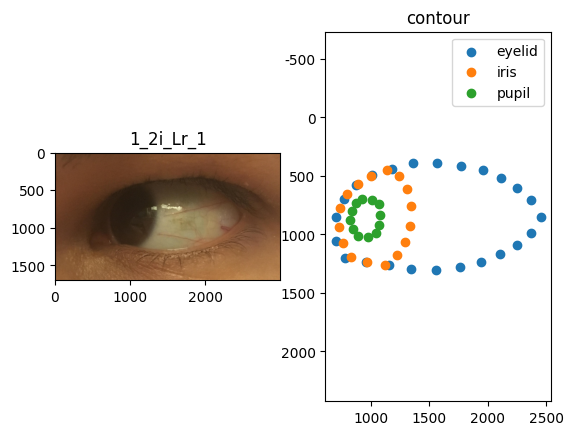

Processing images:  41%|████      | 59/144 [02:53<04:41,  3.32s/it]

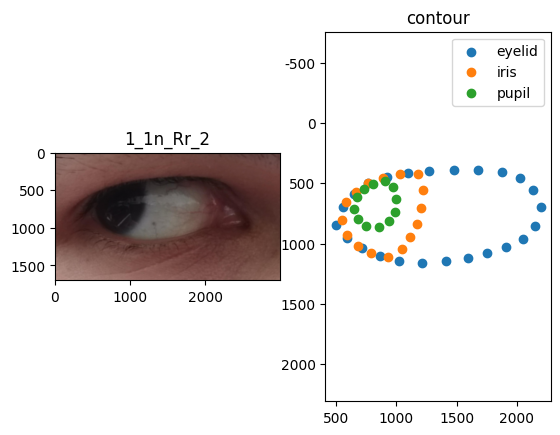

Processing images:  42%|████▏     | 60/144 [02:57<04:44,  3.39s/it]

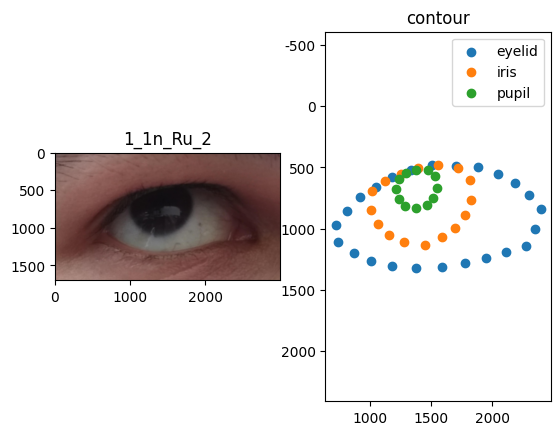

Processing images:  42%|████▏     | 61/144 [02:59<04:27,  3.22s/it]

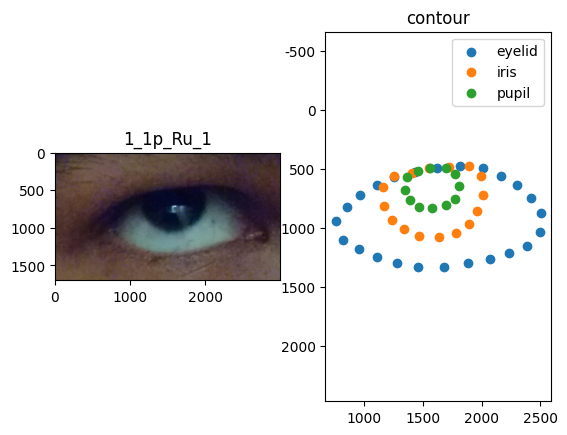

Processing images:  43%|████▎     | 62/144 [03:03<04:21,  3.19s/it]

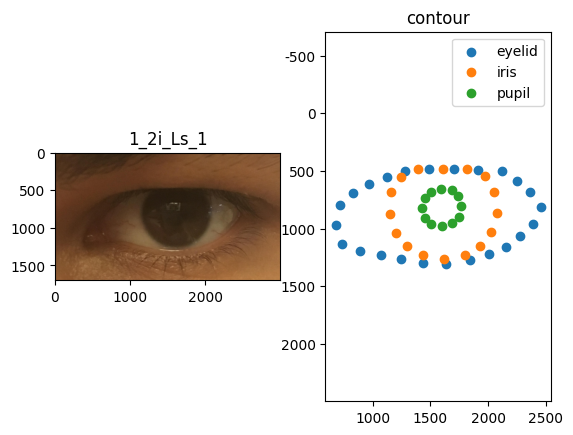

Processing images:  44%|████▍     | 63/144 [03:06<04:26,  3.29s/it]

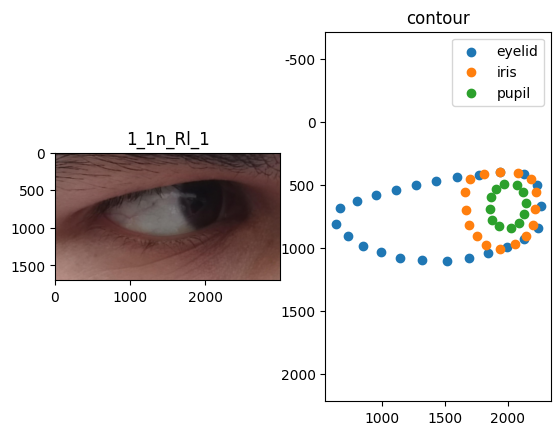

Processing images:  44%|████▍     | 64/144 [03:10<04:33,  3.41s/it]

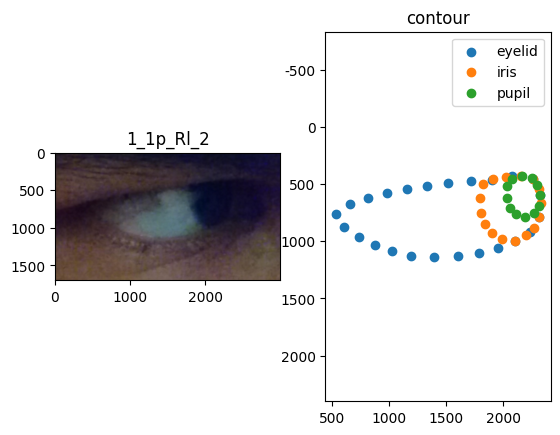

Processing images:  45%|████▌     | 65/144 [03:14<04:49,  3.67s/it]

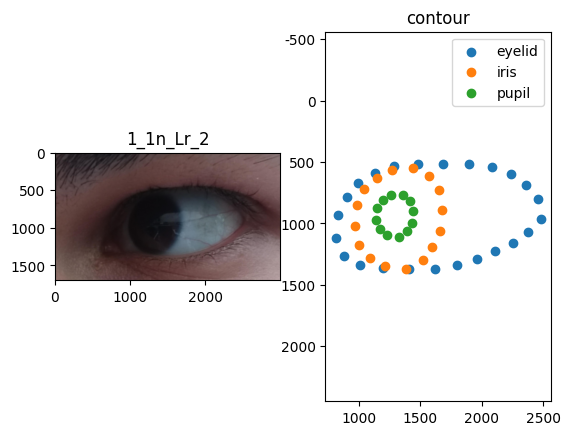

Processing images:  46%|████▌     | 66/144 [03:17<04:20,  3.34s/it]

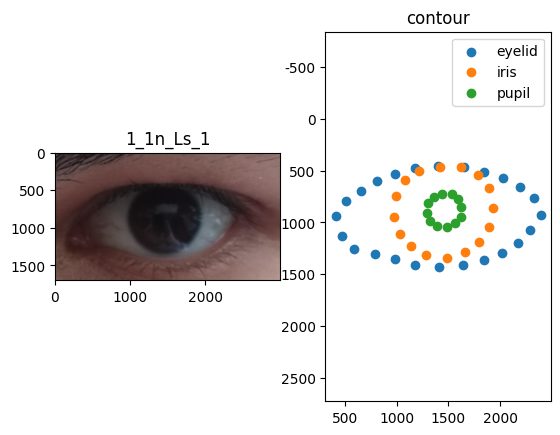

Processing images:  47%|████▋     | 67/144 [03:19<03:59,  3.11s/it]

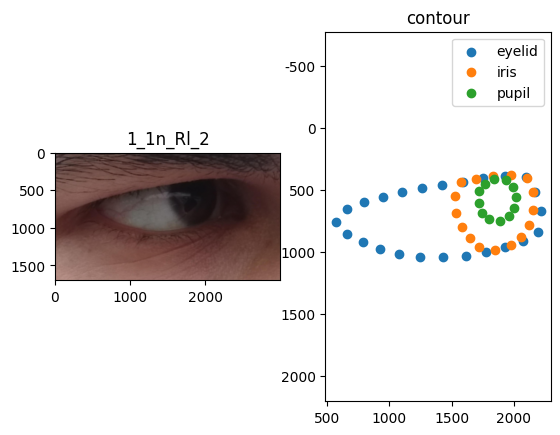

Processing images:  47%|████▋     | 68/144 [03:22<03:52,  3.05s/it]

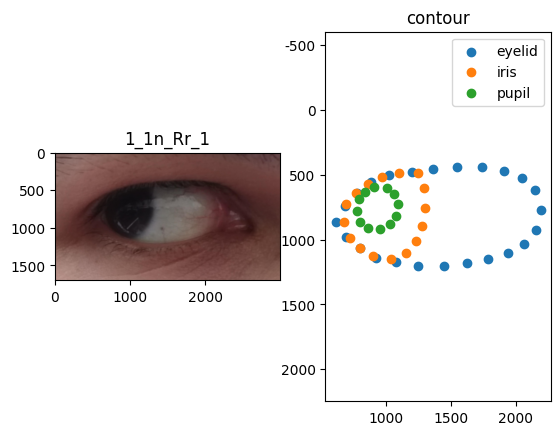

Processing images:  48%|████▊     | 69/144 [03:28<04:59,  4.00s/it]

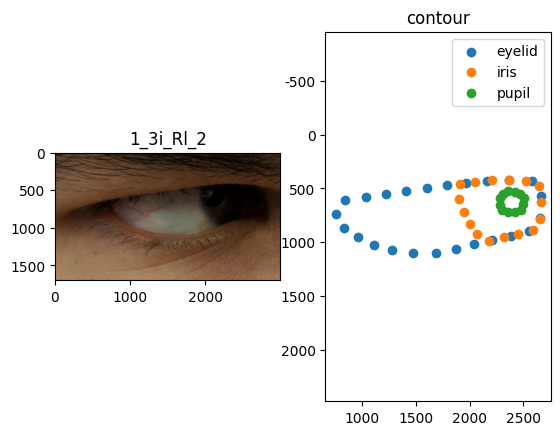

Processing images:  49%|████▊     | 70/144 [03:31<04:23,  3.56s/it]

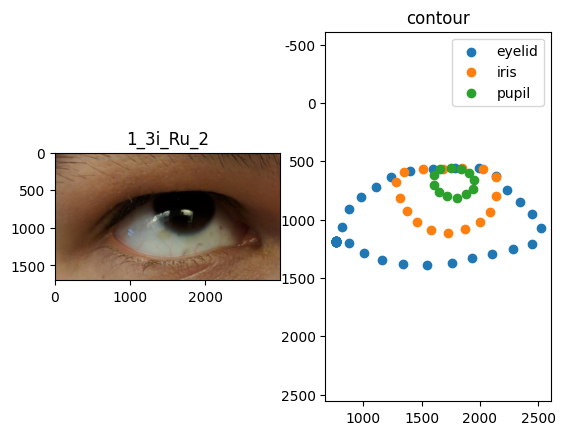

Processing images:  49%|████▉     | 71/144 [03:33<03:58,  3.27s/it]

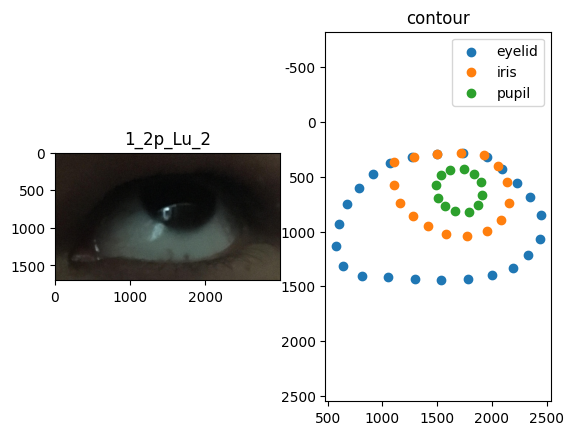

Processing images:  50%|█████     | 72/144 [03:36<03:37,  3.03s/it]

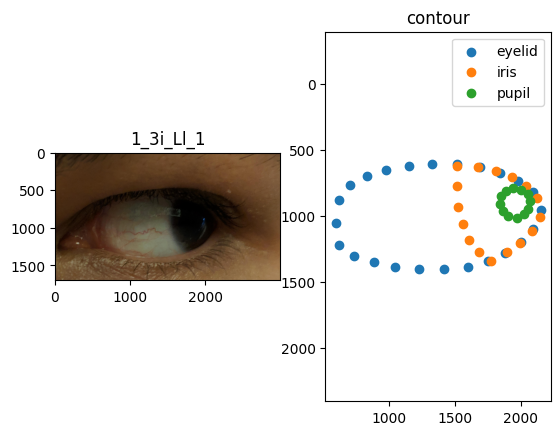

Processing images:  51%|█████     | 73/144 [03:38<03:20,  2.83s/it]

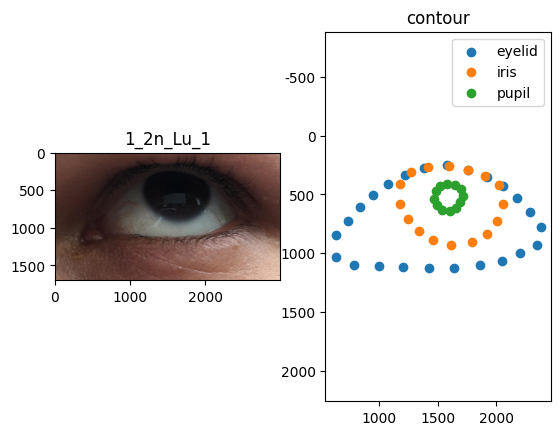

Processing images:  51%|█████▏    | 74/144 [03:42<03:33,  3.06s/it]

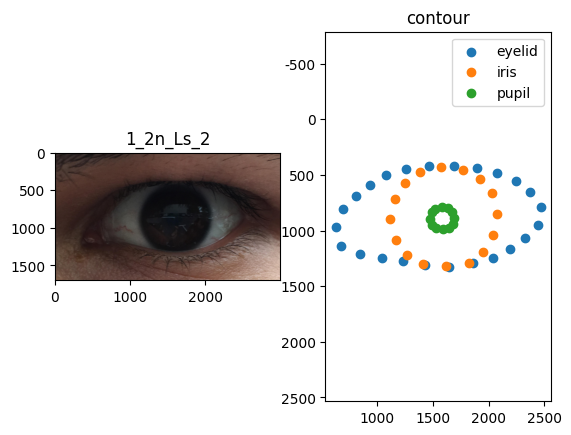

Processing images:  52%|█████▏    | 75/144 [03:44<03:22,  2.93s/it]

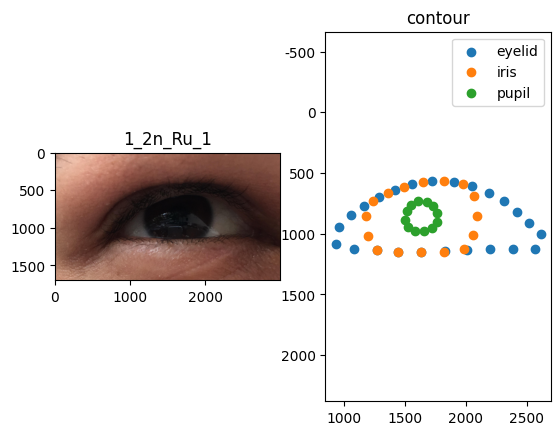

Processing images:  53%|█████▎    | 76/144 [03:47<03:15,  2.87s/it]

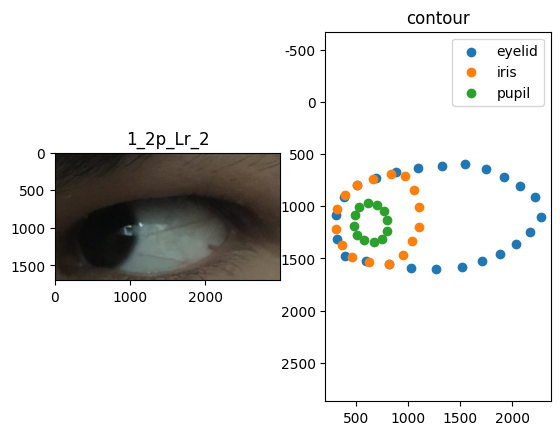

Processing images:  53%|█████▎    | 77/144 [03:50<03:04,  2.75s/it]

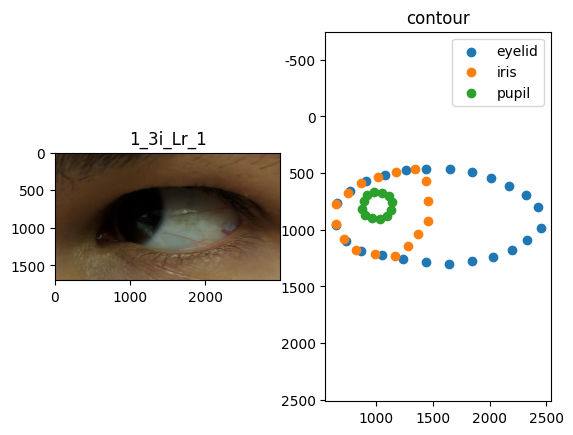

Processing images:  54%|█████▍    | 78/144 [03:52<02:54,  2.64s/it]

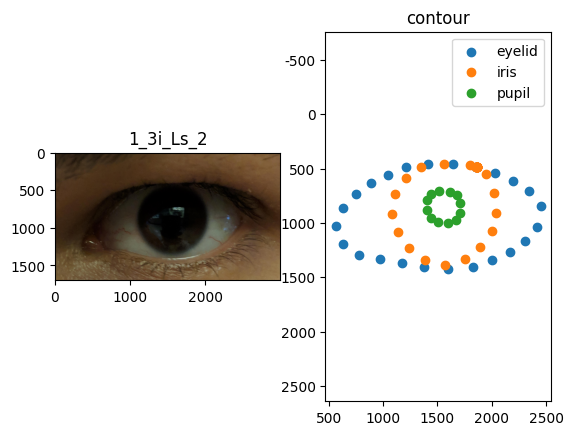

Processing images:  55%|█████▍    | 79/144 [03:55<03:01,  2.80s/it]

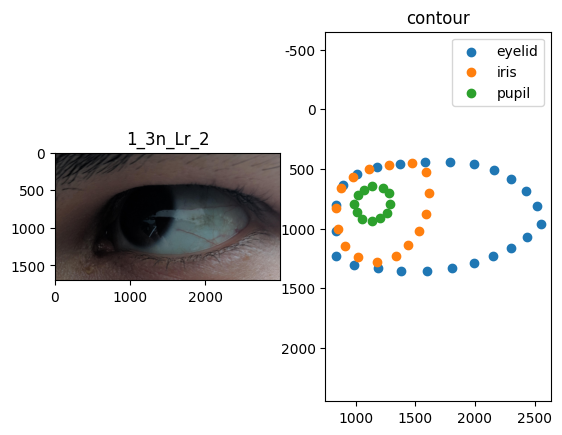

Processing images:  56%|█████▌    | 80/144 [03:58<03:02,  2.85s/it]

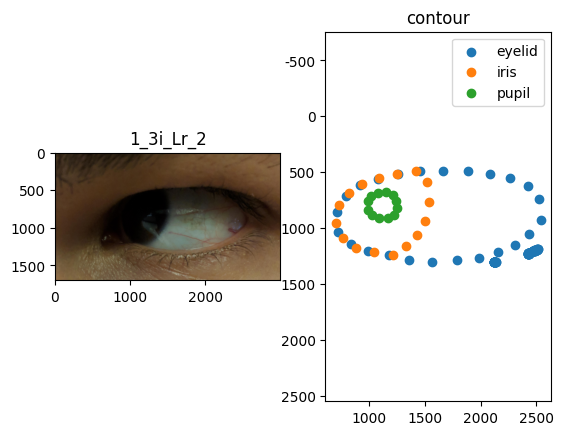

Processing images:  56%|█████▋    | 81/144 [04:01<02:50,  2.70s/it]

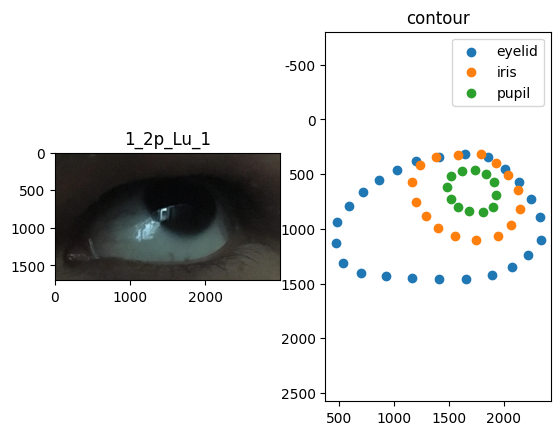

Processing images:  57%|█████▋    | 82/144 [04:03<02:42,  2.62s/it]

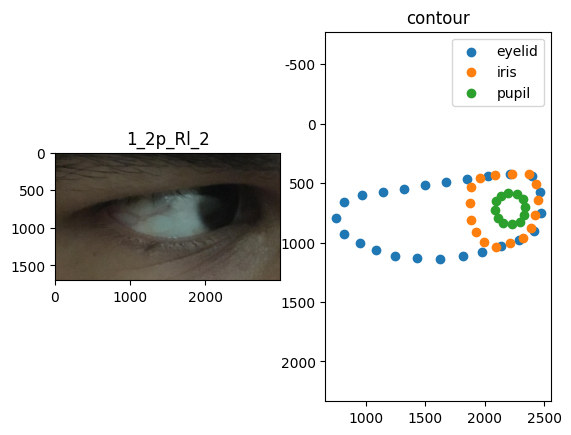

Processing images:  58%|█████▊    | 83/144 [04:06<02:43,  2.68s/it]

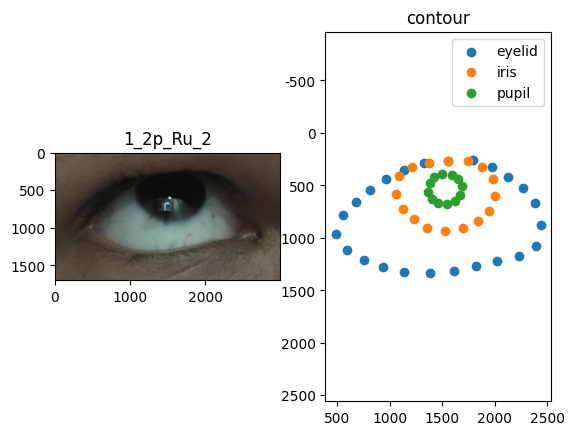

Processing images:  58%|█████▊    | 84/144 [04:10<03:08,  3.14s/it]

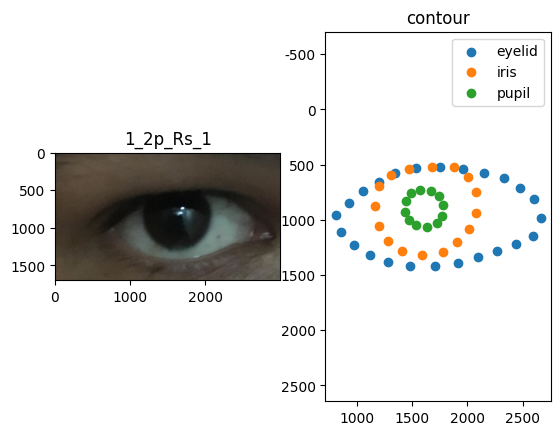

Processing images:  59%|█████▉    | 85/144 [04:13<03:02,  3.09s/it]

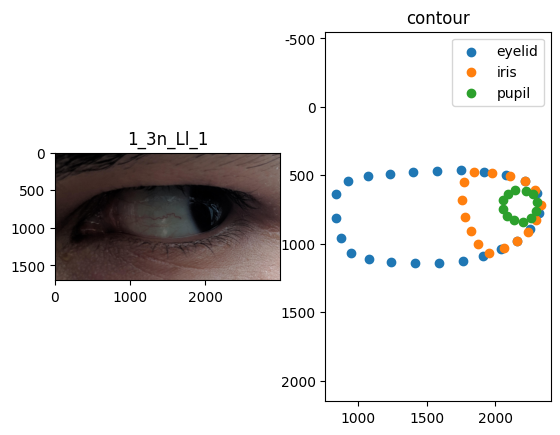

Processing images:  60%|█████▉    | 86/144 [04:15<02:49,  2.93s/it]

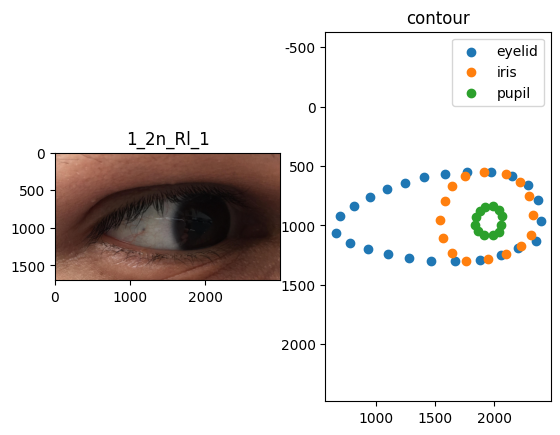

Processing images:  60%|██████    | 87/144 [04:18<02:36,  2.74s/it]

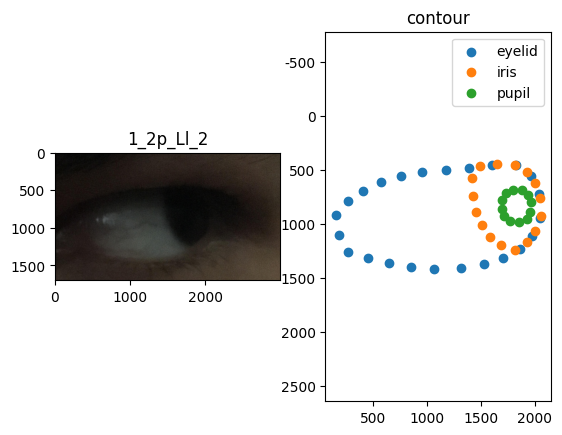

Processing images:  61%|██████    | 88/144 [04:20<02:27,  2.64s/it]

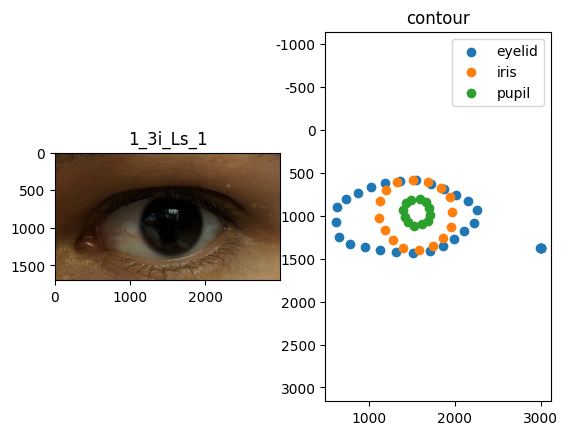

Processing images:  62%|██████▏   | 89/144 [04:23<02:35,  2.82s/it]

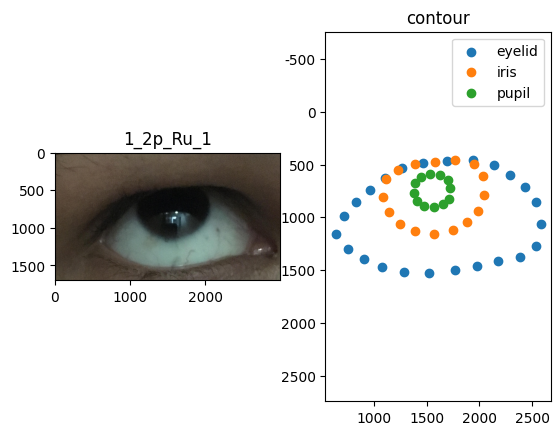

Processing images:  62%|██████▎   | 90/144 [04:27<02:43,  3.02s/it]

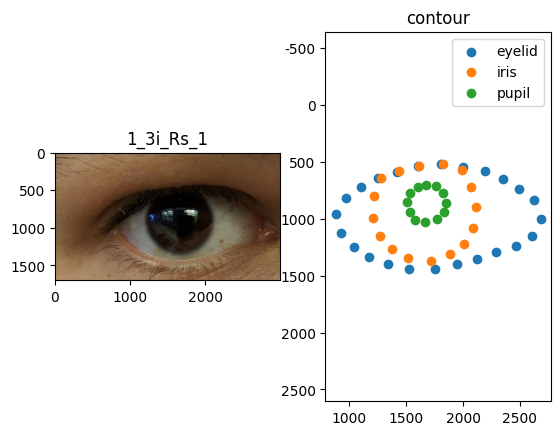

Processing images:  63%|██████▎   | 91/144 [04:29<02:31,  2.86s/it]

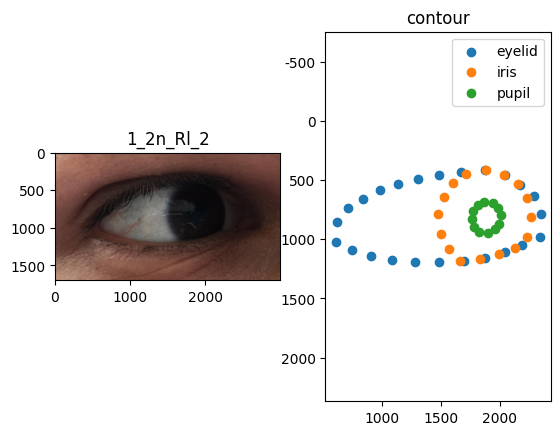

Processing images:  64%|██████▍   | 92/144 [04:32<02:21,  2.73s/it]

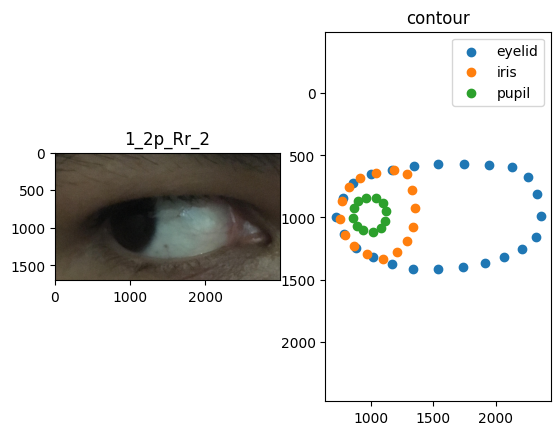

Processing images:  65%|██████▍   | 93/144 [04:34<02:17,  2.70s/it]

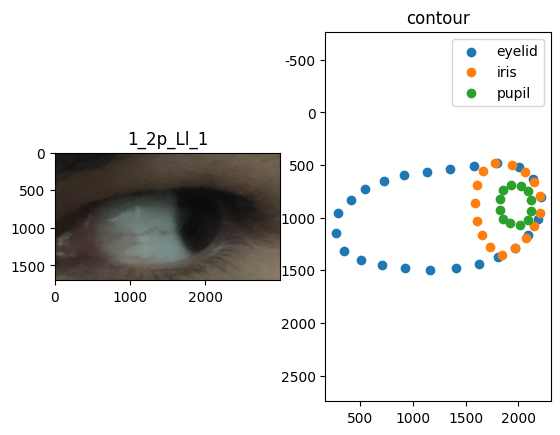

Processing images:  65%|██████▌   | 94/144 [04:38<02:21,  2.83s/it]

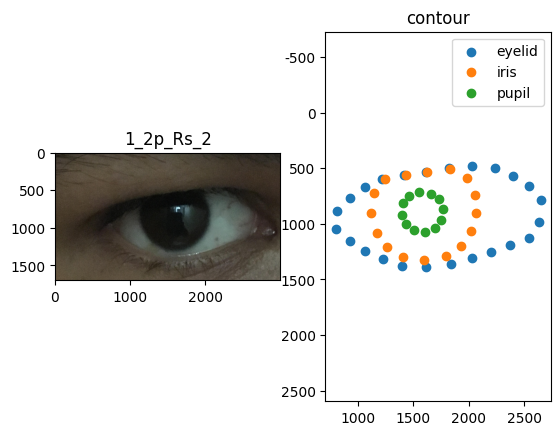

Processing images:  66%|██████▌   | 95/144 [04:41<02:31,  3.09s/it]

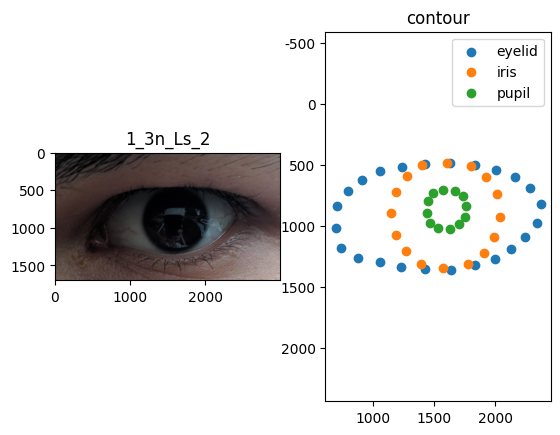

Processing images:  67%|██████▋   | 96/144 [04:45<02:35,  3.23s/it]

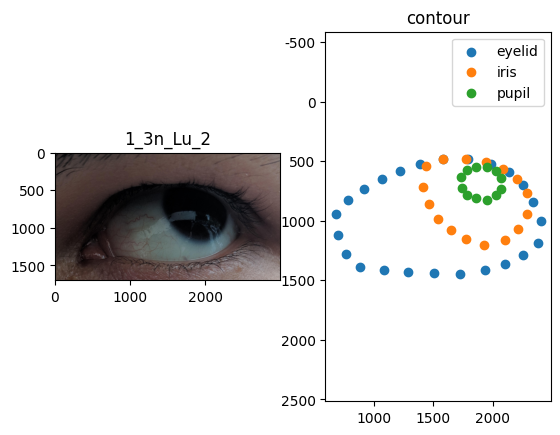

Processing images:  67%|██████▋   | 97/144 [04:47<02:22,  3.04s/it]

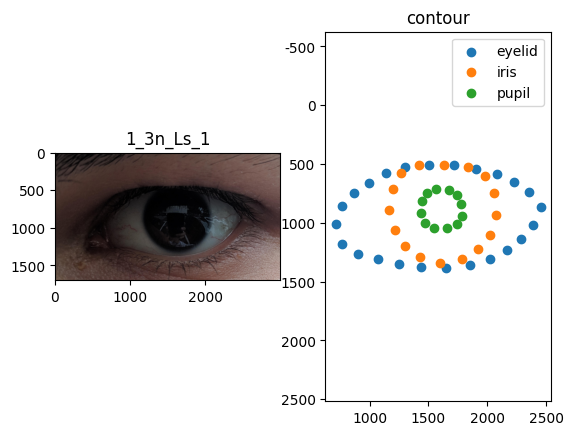

Processing images:  68%|██████▊   | 98/144 [04:50<02:14,  2.92s/it]

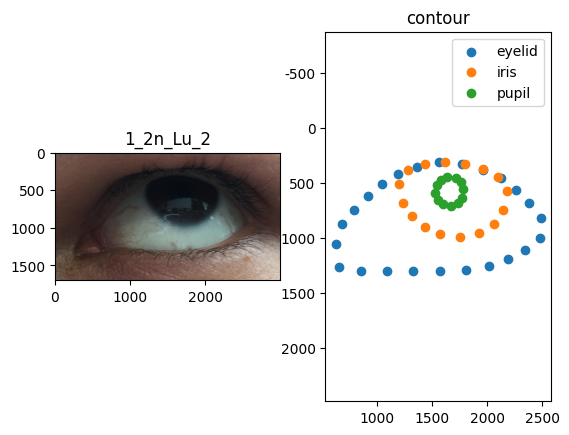

Processing images:  69%|██████▉   | 99/144 [04:53<02:17,  3.06s/it]

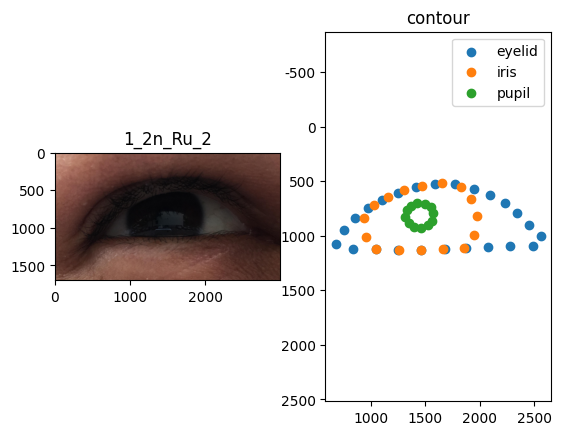

Processing images:  69%|██████▉   | 100/144 [04:56<02:12,  3.02s/it]

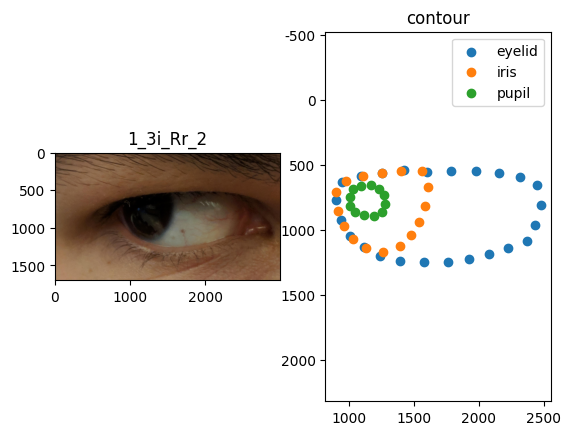

Processing images:  70%|███████   | 101/144 [04:59<02:04,  2.90s/it]

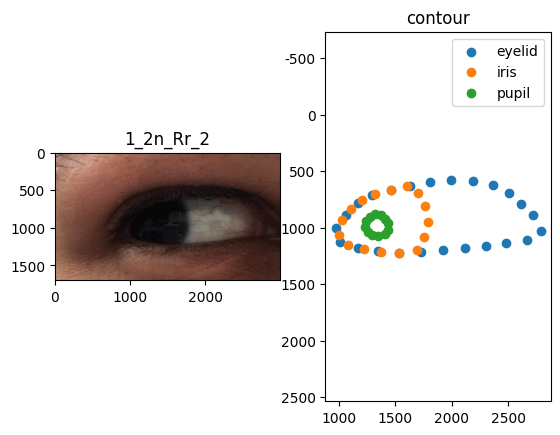

Processing images:  71%|███████   | 102/144 [05:01<01:55,  2.75s/it]

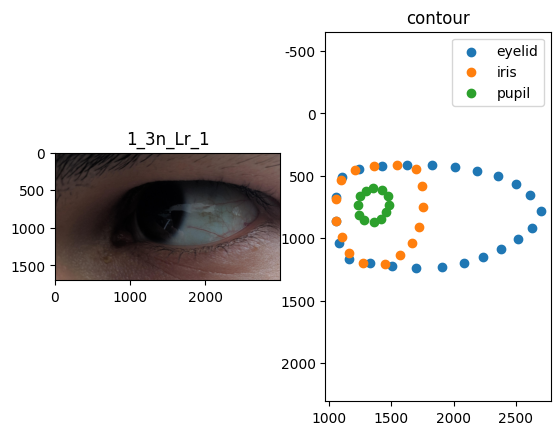

Processing images:  72%|███████▏  | 103/144 [05:04<01:51,  2.71s/it]

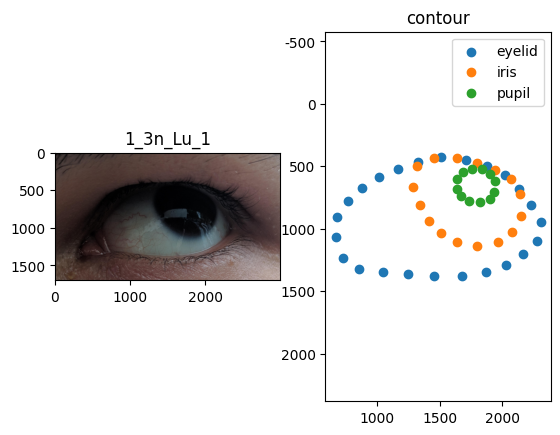

Processing images:  72%|███████▏  | 104/144 [05:08<02:01,  3.04s/it]

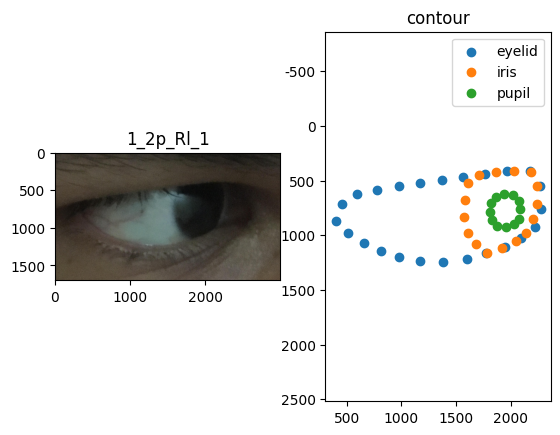

Processing images:  73%|███████▎  | 105/144 [05:11<01:59,  3.06s/it]

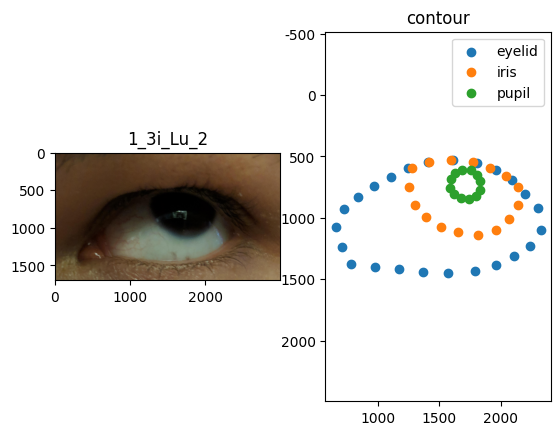

Processing images:  74%|███████▎  | 106/144 [05:13<01:49,  2.89s/it]

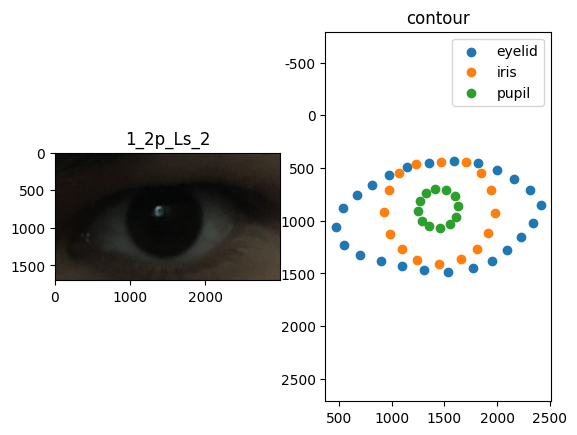

Processing images:  74%|███████▍  | 107/144 [05:16<01:45,  2.85s/it]

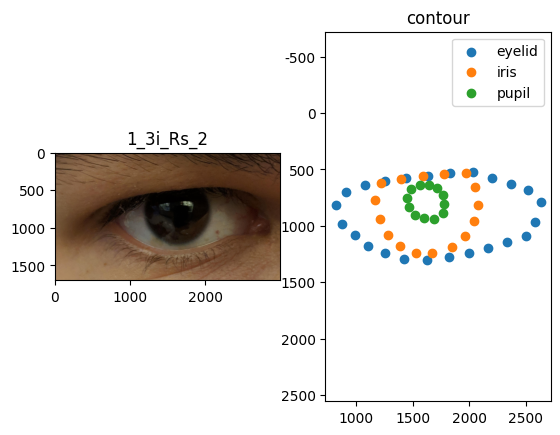

Processing images:  75%|███████▌  | 108/144 [05:19<01:37,  2.72s/it]

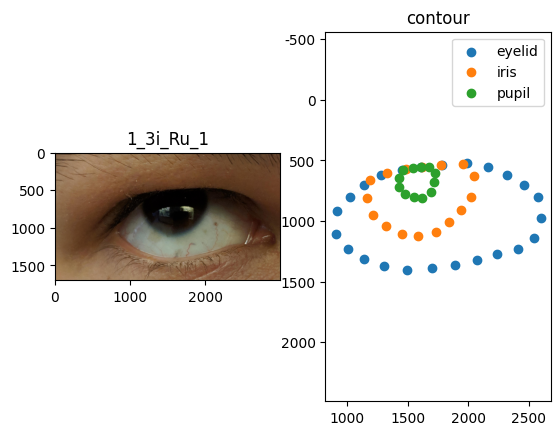

Processing images:  76%|███████▌  | 109/144 [05:22<01:39,  2.84s/it]

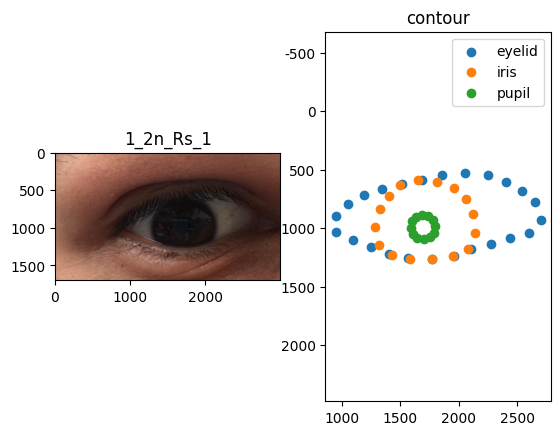

Processing images:  76%|███████▋  | 110/144 [05:26<01:50,  3.24s/it]

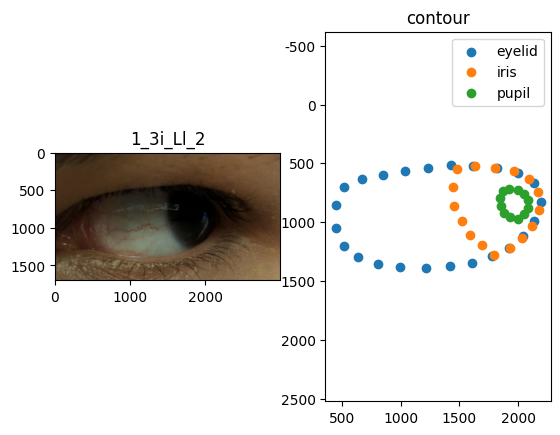

Processing images:  77%|███████▋  | 111/144 [05:30<01:57,  3.55s/it]

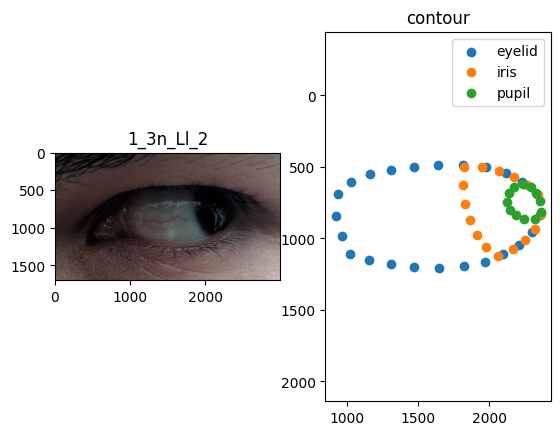

Processing images:  78%|███████▊  | 112/144 [05:33<01:45,  3.29s/it]

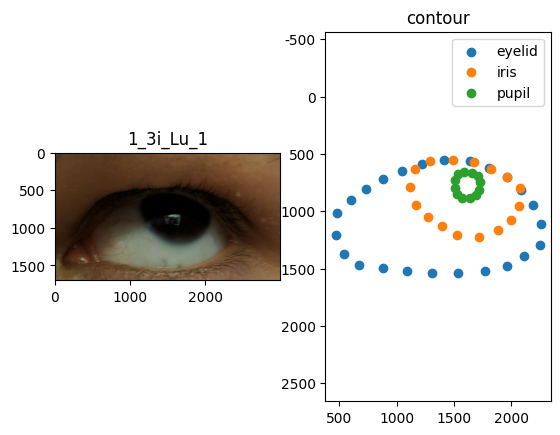

Processing images:  78%|███████▊  | 113/144 [05:36<01:40,  3.25s/it]

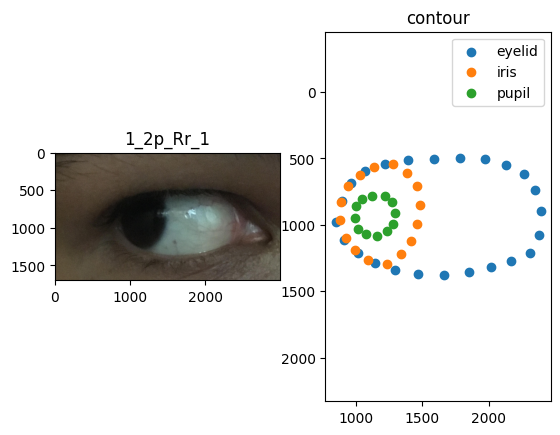

Processing images:  79%|███████▉  | 114/144 [05:39<01:36,  3.21s/it]

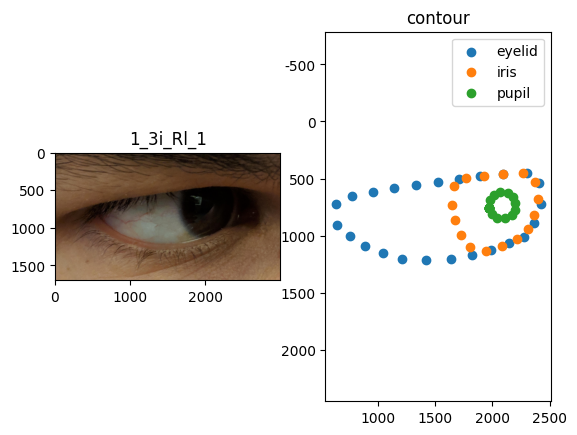

Processing images:  80%|███████▉  | 115/144 [05:42<01:26,  2.97s/it]

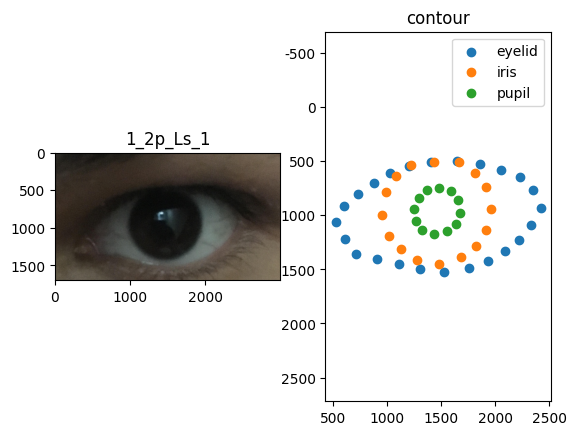

Processing images:  81%|████████  | 116/144 [05:44<01:19,  2.83s/it]

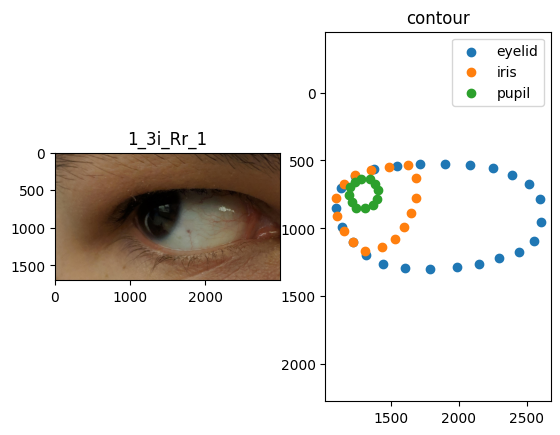

Processing images:  81%|████████▏ | 117/144 [05:47<01:13,  2.71s/it]

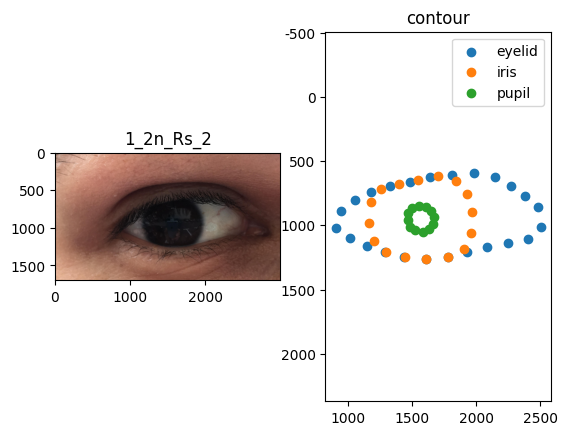

Processing images:  82%|████████▏ | 118/144 [05:49<01:10,  2.70s/it]

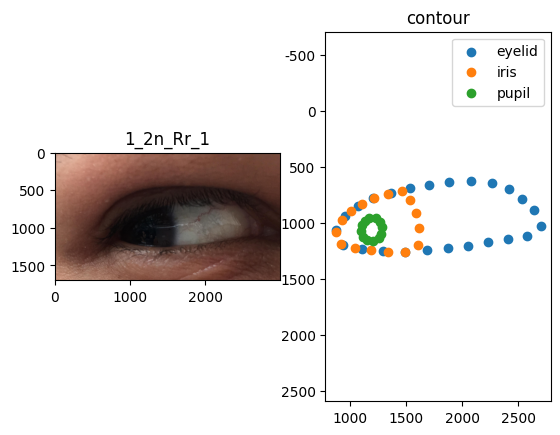

Processing images:  83%|████████▎ | 119/144 [05:53<01:14,  2.99s/it]

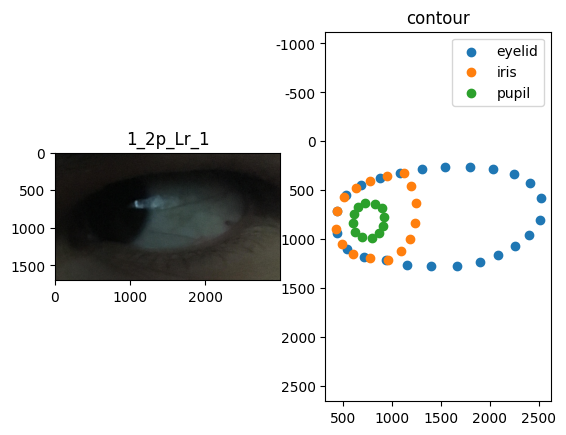

Processing images:  83%|████████▎ | 120/144 [05:56<01:15,  3.17s/it]

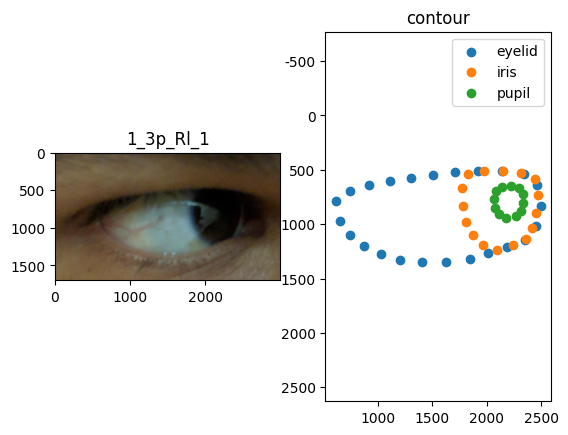

Processing images:  84%|████████▍ | 121/144 [05:59<01:08,  2.97s/it]

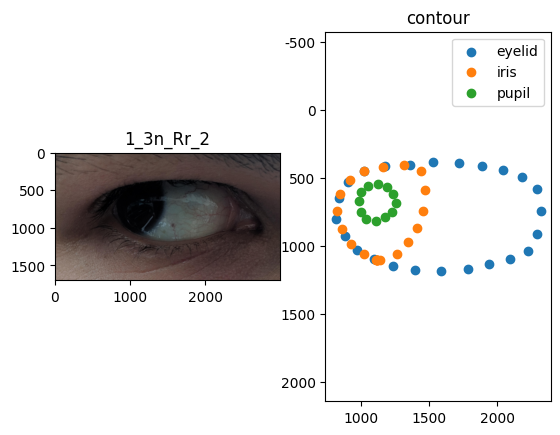

Processing images:  85%|████████▍ | 122/144 [06:01<01:02,  2.84s/it]

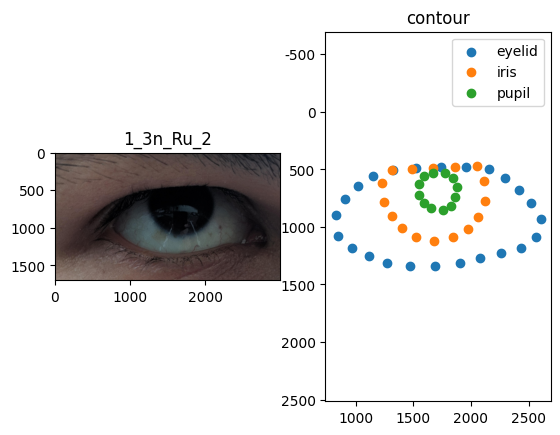

Processing images:  85%|████████▌ | 123/144 [06:04<01:00,  2.89s/it]

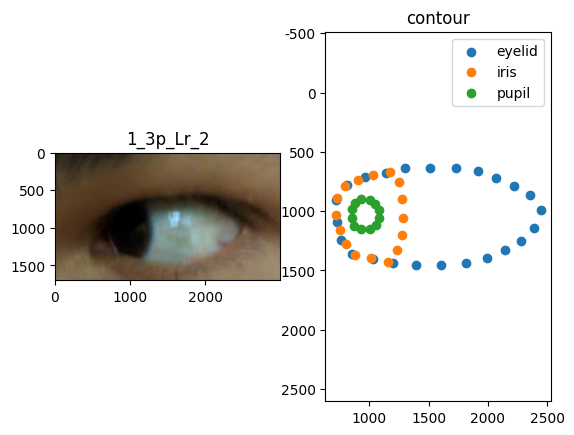

Processing images:  86%|████████▌ | 124/144 [06:08<01:02,  3.12s/it]

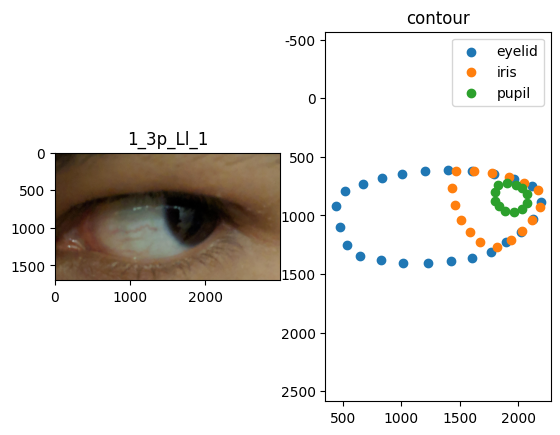

Processing images:  87%|████████▋ | 125/144 [06:11<00:54,  2.89s/it]

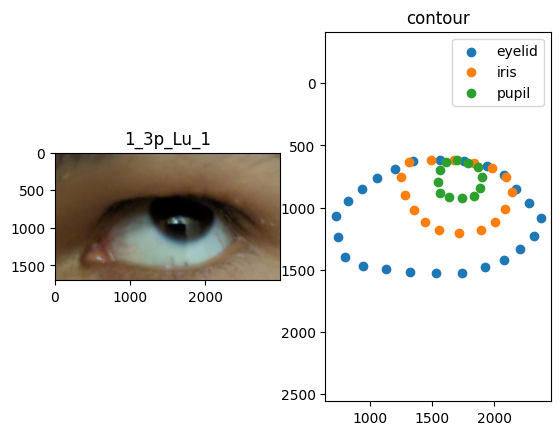

Processing images:  88%|████████▊ | 126/144 [06:13<00:51,  2.86s/it]

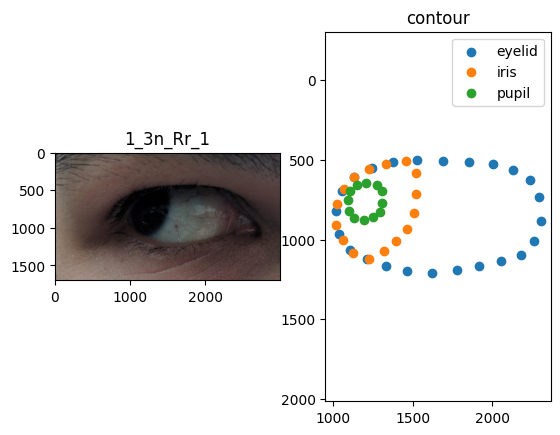

Processing images:  88%|████████▊ | 127/144 [06:16<00:46,  2.75s/it]

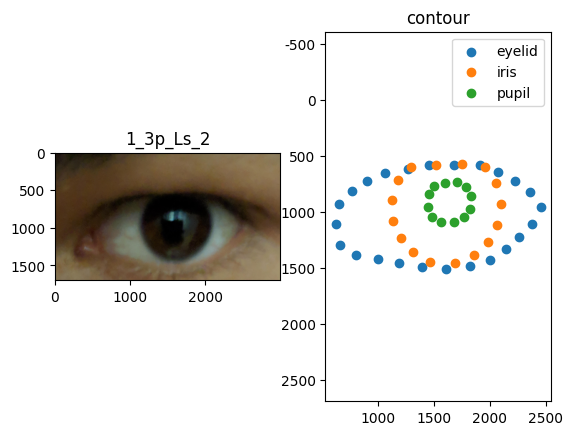

Processing images:  89%|████████▉ | 128/144 [06:18<00:43,  2.71s/it]

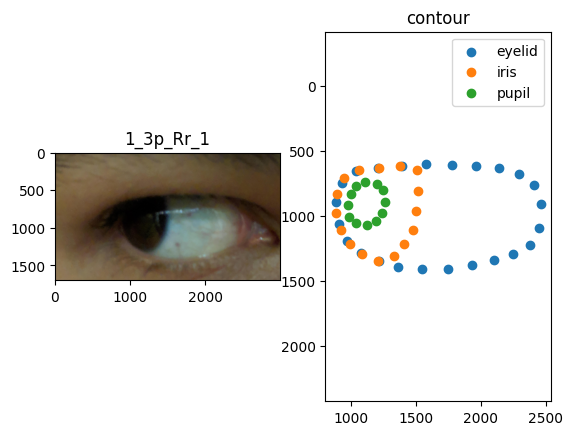

Processing images:  90%|████████▉ | 129/144 [06:23<00:47,  3.18s/it]

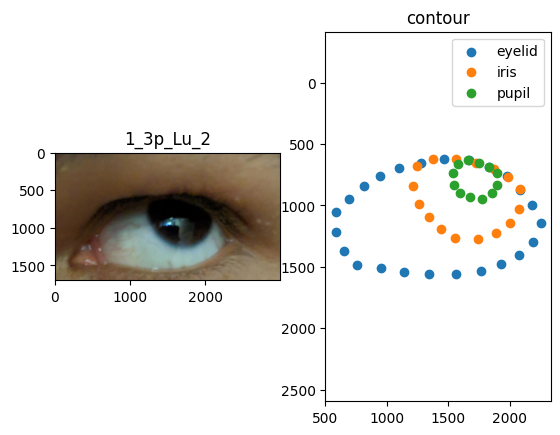

Processing images:  90%|█████████ | 130/144 [06:25<00:41,  2.96s/it]

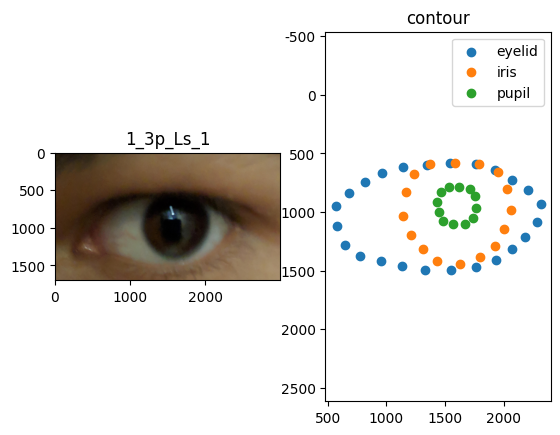

Processing images:  91%|█████████ | 131/144 [06:28<00:36,  2.80s/it]

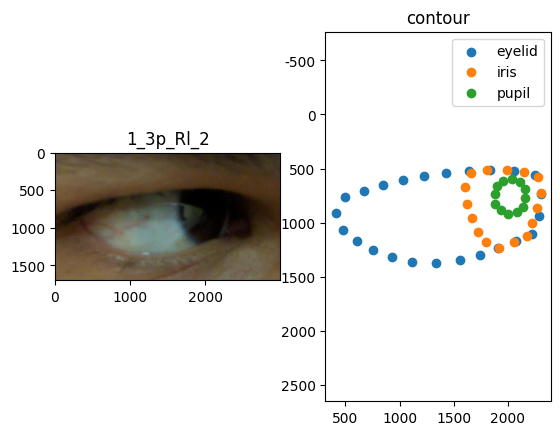

Processing images:  92%|█████████▏| 132/144 [06:30<00:33,  2.77s/it]

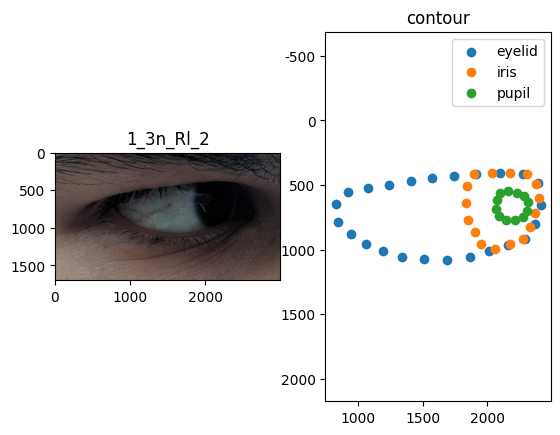

Processing images:  92%|█████████▏| 133/144 [06:33<00:29,  2.72s/it]

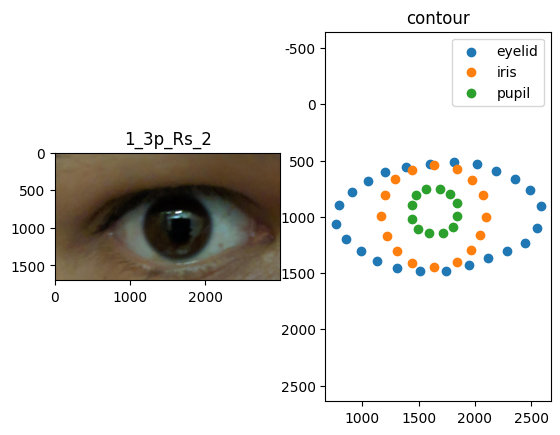

Processing images:  93%|█████████▎| 134/144 [06:38<00:33,  3.35s/it]

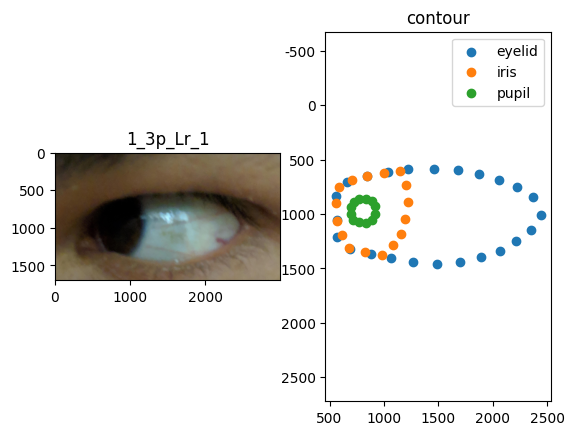

Processing images:  94%|█████████▍| 135/144 [06:42<00:31,  3.50s/it]

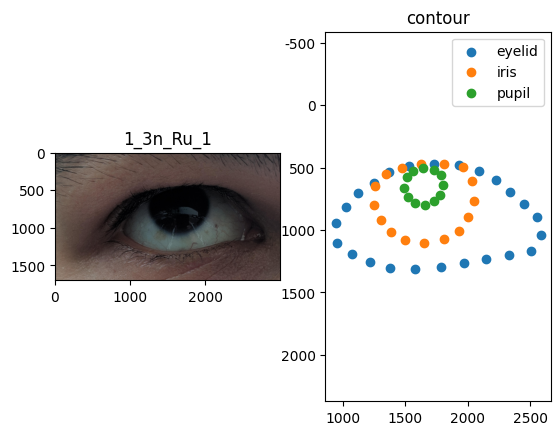

Processing images:  94%|█████████▍| 136/144 [06:45<00:27,  3.44s/it]

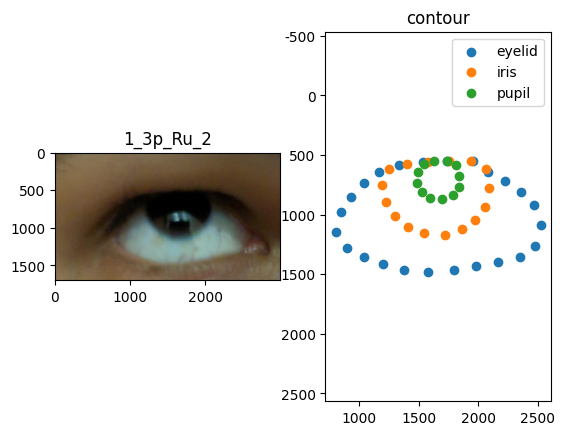

Processing images:  95%|█████████▌| 137/144 [06:48<00:22,  3.26s/it]

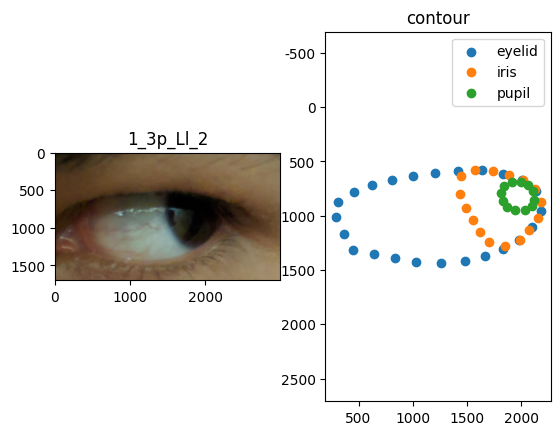

Processing images:  96%|█████████▌| 138/144 [06:51<00:19,  3.21s/it]

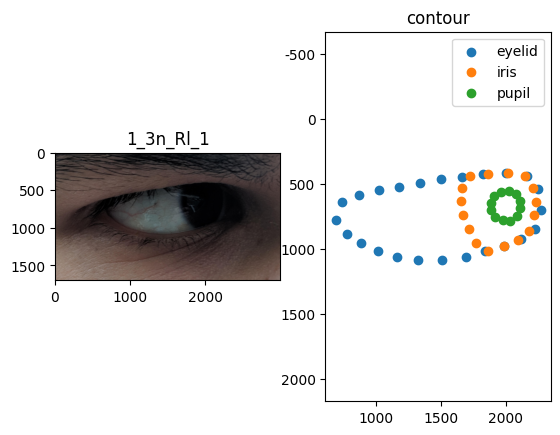

Processing images:  97%|█████████▋| 139/144 [06:54<00:16,  3.32s/it]

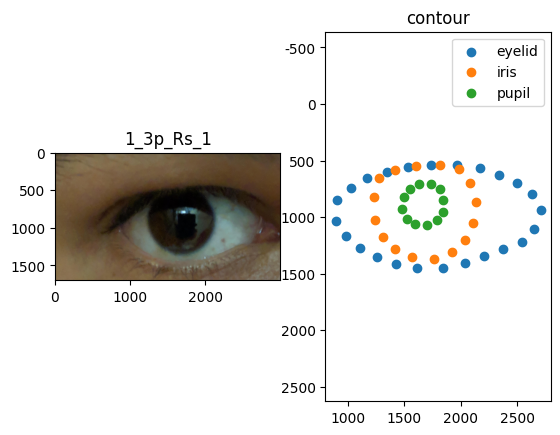

Processing images:  97%|█████████▋| 140/144 [06:57<00:12,  3.08s/it]

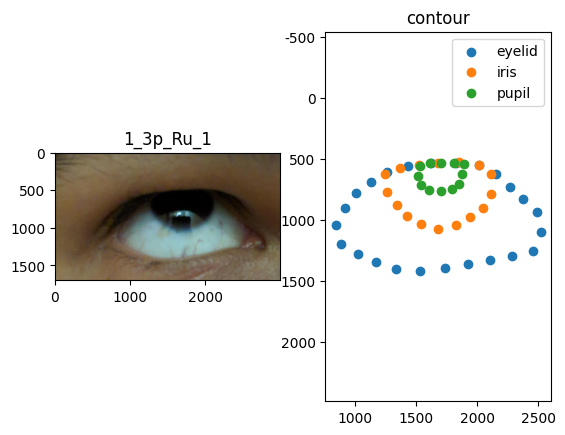

Processing images:  98%|█████████▊| 141/144 [06:59<00:08,  2.91s/it]

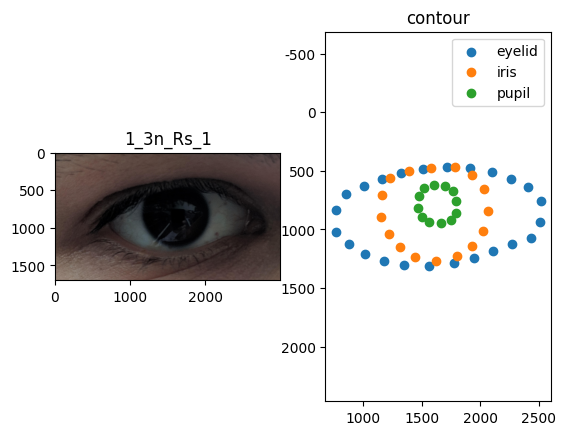

Processing images:  99%|█████████▊| 142/144 [07:02<00:05,  2.86s/it]

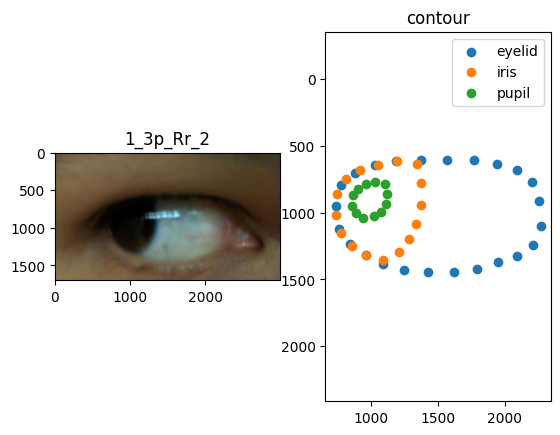

Processing images:  99%|█████████▉| 143/144 [07:05<00:02,  2.99s/it]

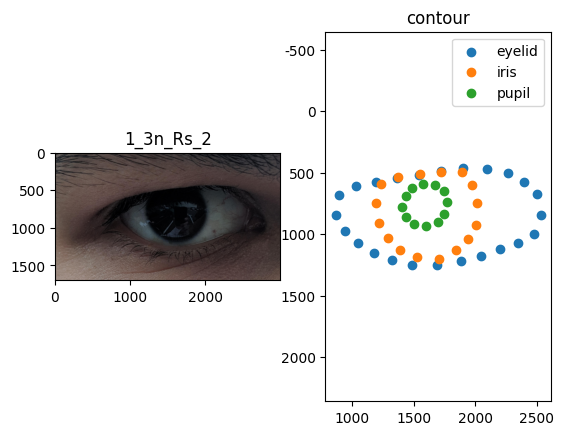

Processing images: 100%|██████████| 144/144 [07:09<00:00,  2.98s/it]


In [ ]:
#@title #Mobius to label起動
#@markdown 　[shift]+[Enter]を押して起動してください。
#@markdown　<br>うまくいっていないラベルも存在するので、目視で確認して除外すべきかもしれません。
def create_mask(image, color):
    return np.all(image == color, axis=-1)

def apply_mask(image, mask):
    return np.where(mask, 255, 0)

def extract_contours(img, _num_points):
    contours = measure.find_contours(img, 0.5)
    points_list = []

    for contour in contours:
        contour_length = len(contour)

        if contour_length > _num_points:
            step = contour_length // _num_points
            selected_points = [contour[i * step] for i in range(_num_points)]
        else:
            selected_points = contour

        points = [[float(point[1]), float(point[0])] for point in selected_points]
        points_list.append(points)

    return points_list

def create_custom_output(points_list_blue, points_list_blue_green, points_list_all_colors, img_width, img_height, output_file):
    with open(output_file, 'w') as f:
        # 0: eyelid
        f.write("0 ")
        for point in points_list_all_colors[0]:
            x = point[0] / img_width
            y = point[1] / img_height
            f.write(f"{x} {y} ")
        f.write("\n")

        # 1: iris
        f.write("1 ")
        for point in points_list_blue_green[0]:
            x = point[0] / img_width
            y = point[1] / img_height
            f.write(f"{x} {y} ")
        f.write("\n")

        # 2: pupil
        f.write("2 ")
        for point in points_list_blue[0]:
            x = point[0] / img_width
            y = point[1] / img_height
            f.write(f"{x} {y} ")
        f.write("\n")

def process_image(mask_file, output_dir, num_points_eyelid, num_points_iris, num_points_pupil):
    img = cv2.imread(mask_file, cv2.IMREAD_COLOR)
    img_height, img_width = img.shape[:2]

    mask_blue = create_mask(img, [255, 0, 0])
    mask_green = create_mask(img, [0, 255, 0])
    mask_red = create_mask(img, [0, 0, 255])

    mask_blue_green = np.logical_or(mask_blue, mask_green)
    mask_all_colors = np.logical_or(mask_blue_green, mask_red)

    img_blue = apply_mask(img, mask_blue)
    img_blue_green = apply_mask(img, mask_blue_green)
    img_all_colors = apply_mask(img, mask_all_colors)

    # 各ラベルごとに異なる個数の座標を抽出
    points_list_blue = extract_contours(img_blue, num_points_pupil)
    points_list_blue_green = extract_contours(img_blue_green, num_points_iris)
    points_list_all_colors = extract_contours(img_all_colors, num_points_eyelid)

    # 出力先ディレクトリとファイル名を設定
    base_name = os.path.splitext(os.path.basename(mask_file))[0]
    output_file = os.path.join(output_dir, base_name + ".txt")

    # カスタム出力
    create_custom_output(points_list_blue, points_list_blue_green, points_list_all_colors, img_width, img_height, output_file)

    # 元画像と輪郭の比較プロット
    matplotlib.rcParams['axes.unicode_minus'] = False

    points_eyelid = []
    points_iris = []
    points_pupil = []

    for points in points_list_all_colors:
        points_eyelid += points
    for points in points_list_blue_green:
        points_iris += points
    for points in points_list_blue:
        points_pupil += points

    x_eyelid = [point[0] for point in points_eyelid]
    y_eyelid = [point[1] for point in points_eyelid]

    x_iris = [point[0] for point in points_iris]
    y_iris = [point[1] for point in points_iris]

    x_pupil = [point[0] for point in points_pupil]
    y_pupil = [point[1] for point in points_pupil]

    # 元の画像を読み込む
    img_path = mask_file.replace("Masks", "Images").replace(".png", ".jpg")
    img = cv2.imread(img_path, cv2.IMREAD_COLOR)

    # 図の左隣に元の画像を表示し、ファイル名をタイトルに設定
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(base_name)  # ファイル名をタイトルに設定

    # 図の右隣に散布図を表示する
    plt.subplot(1, 2, 2)
    plt.scatter(x_eyelid, y_eyelid, label='eyelid')
    plt.scatter(x_iris, y_iris, label='iris')
    plt.scatter(x_pupil, y_pupil, label='pupil')
    plt.title("contour")  # 輪郭

    # 縦横の縮尺を同じにする
    plt.axis('equal')

    # 縦軸を降順にする
    plt.gca().invert_yaxis()

    # 凡例を表示する
    plt.legend()

    # 図を表示する
    plt.show()

def process_all_images_in_directory(input_dir, output_dir, num_points_eyelid, num_points_iris, num_points_pupil):
    # 入力ディレクトリ内のすべての.pngファイルを処理
    png_files = [file_name for file_name in os.listdir(input_dir) if file_name.endswith(".png")]

    # tqdmを使って進行状況を表示
    for file_name in tqdm(png_files, desc="Processing images"):
        mask_file = os.path.join(input_dir, file_name)
        process_image(mask_file, output_dir, num_points_eyelid, num_points_iris, num_points_pupil)



if __name__ == '__main__':
    process_all_images_in_directory(input_dir, output_dir, num_points_eyelid, num_points_iris, num_points_pupil)


# 備考欄

## ラベルの構造

0 x1 y1 x2 y2 x3 y3...(eyelidの座標)<br>
1 x1 y1 x2 y2 x3 y3...(irisの座標)<br>
2 x1 y1 x2 y2 x3 y3...(pupilの座標)

## うまくいっていない例

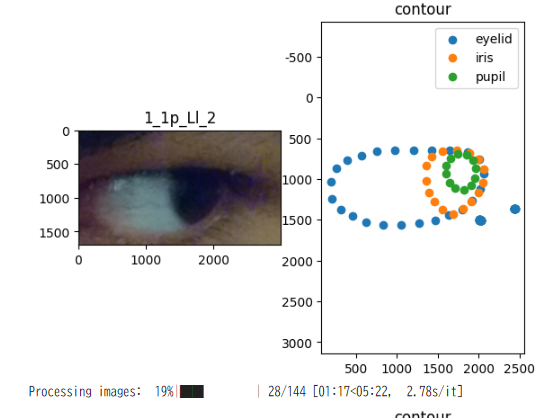

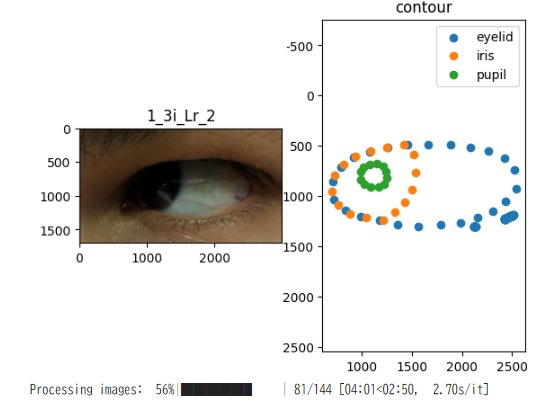

## 確認用のコード

しかし、以下のコードでもう一度プロットしてみると問題ないです…なぜ

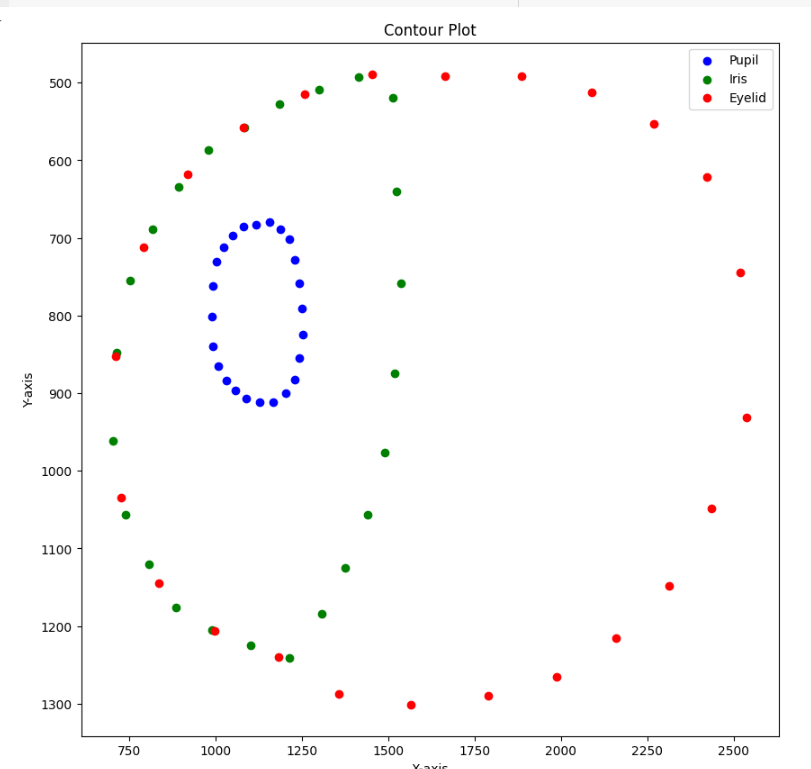

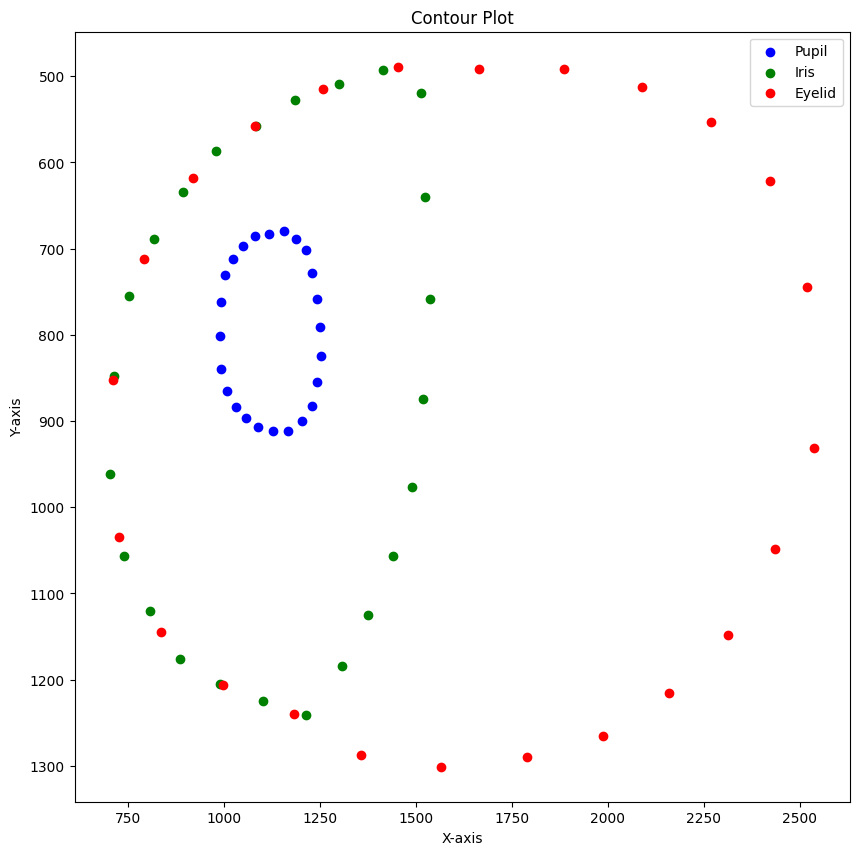

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import measure

# Define functions for processing
def create_mask(image, color):
    return np.all(image == color, axis=-1)

def apply_mask(image, mask):
    return np.where(mask, 255, 0)

def extract_contours(img, _num_points):
    contours = measure.find_contours(img, 0.5)
    points_list = []

    for contour in contours:
        contour_length = len(contour)

        if contour_length > _num_points:
            step = contour_length // _num_points
            selected_points = [contour[i * step] for i in range(_num_points)]
        else:
            selected_points = contour

        points = [[float(point[1]), float(point[0])] for point in selected_points]
        points_list.append(points)

    return points_list

# Load the image to debug
mask_file = "/content/drive/MyDrive/Colab Notebooks/anterior_segmentation_project/dataset/MOBIUS/Masks/1/1_3i_Lr_2.png"
img = cv2.imread(mask_file, cv2.IMREAD_COLOR)
img_height, img_width = img.shape[:2]

# Define color masks
mask_blue = create_mask(img, [255, 0, 0])
mask_green = create_mask(img, [0, 255, 0])
mask_red = create_mask(img, [0, 0, 255])

# Combine masks for different regions
mask_blue_green = np.logical_or(mask_blue, mask_green)
mask_all_colors = np.logical_or(mask_blue_green, mask_red)

# Apply masks
img_blue = apply_mask(img, mask_blue)
img_blue_green = apply_mask(img, mask_blue_green)
img_all_colors = apply_mask(img, mask_all_colors)

# Extract contours
num_points = 24  # Default number of points
points_list_blue = extract_contours(img_blue, num_points)
points_list_blue_green = extract_contours(img_blue_green, num_points)
points_list_all_colors = extract_contours(img_all_colors, num_points)

# Plot points on coordinate plane
plt.figure(figsize=(10, 10))

# Plot blue (pupil)
if points_list_blue:
    x_blue = [point[0] for point in points_list_blue[0]]
    y_blue = [point[1] for point in points_list_blue[0]]
    plt.scatter(x_blue, y_blue, color='blue', label='Pupil')

# Plot blue_green (iris)
if points_list_blue_green:
    x_blue_green = [point[0] for point in points_list_blue_green[0]]
    y_blue_green = [point[1] for point in points_list_blue_green[0]]
    plt.scatter(x_blue_green, y_blue_green, color='green', label='Iris')

# Plot all_colors (eyelid)
if points_list_all_colors:
    x_all_colors = [point[0] for point in points_list_all_colors[0]]
    y_all_colors = [point[1] for point in points_list_all_colors[0]]
    plt.scatter(x_all_colors, y_all_colors, color='red', label='Eyelid')

# Adjust plot
plt.title("Contour Plot")
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.gca().invert_yaxis()  # Invert Y-axis to match image coordinates
plt.legend()

# Show plot
plt.show()


## [試作品段階のコード](https://colab.research.google.com/drive/16fyns7E-PEstRELygVeMyLE5gbmVhyPe#scrollTo=NYNAK-r12mPz)

念のために共有します。